<center><img src = "https://github.com/Trading-com-Dados/pmf/blob/main/logotipo-trading-com-dados.svg?raw=true" width = "200">

<center><img src = "https://github.com/Trading-com-Dados/pmf/blob/main/PMF%20002.png?raw=true" width = "700">

---
# **Análise Fundamentalista com Python**
---

## **1. Bibliotecas**

In [57]:
import pandas as pd
import numpy as np
import requests
import zipfile
import io
import xlsxwriter
import plotly.graph_objects as go
import yfinance as yf
import os
from datetime import datetime
import vectorbt as vbt

In [55]:
!pip install zipfile36
!pip install io
!pip install xlsxwriter
!pip install plotly
!pip install yfinance
!pip install vectorbt

ERROR: Could not find a version that satisfies the requirement io (from versions: none)
ERROR: No matching distribution found for io


## **2. Extração de Dados**

### **2.1. Obtendo Dados Cadastrais das Empresas de Capital Aberto**

In [2]:
link = 'http://dados.cvm.gov.br/dados/CIA_ABERTA/CAD/DADOS/cad_cia_aberta.csv'

In [3]:
r = requests.get(link)

In [4]:
linhas = []

for i in r.text.split('\n'):
  linhas.append(i.strip().split(';'))

#### **2.1.1. Transformação para Dataframe**

In [5]:
data = pd.DataFrame(linhas[1:], columns = linhas[0])

In [6]:
data.head()

,CNPJ_CIA,DENOM_SOCIAL,DENOM_COMERC,DT_REG,DT_CONST,DT_CANCEL,MOTIVO_CANCEL,SIT,DT_INI_SIT,CD_CVM,...,UF_RESP,PAIS_RESP,CEP_RESP,DDD_TEL_RESP,TEL_RESP,DDD_FAX_RESP,FAX_RESP,EMAIL_RESP,CNPJ_AUDITOR,AUDITOR
0,08.773.135/0001-00,2W ECOBANK S.A.,2W ECOBANK S.A.,2020-10-29,2007-03-23,,,ATIVO,2020-10-29,25224,...,,,4711905,11,39579400,,,juridico@2wecobank.com.br,10.830.108/0001-65,GRANT THORNTON AUDITORES INDEPENDENTES LTDA.
1,11.396.633/0001-87,3A COMPANHIA SECURITIZADORA,TRIPLO A COMPANHIA SECURITIZADORA,2010-03-08,2009-11-03,2015-12-18,Cancelamento Voluntário - IN CVM 480/09,CANCELADA,2015-12-18,21954,...,RJ,,20020000,21,22338867,21,22338867,juridico@triploasec.com.br,60.525.706/0001-07,MOORE STEPHENS LIMA LUCCHESI AUDITORES INDEPEN...
2,01.547.749/0001-16,521 PARTICIPAÇOES S.A. - EM LIQUIDAÇĂO EXTRAJU...,521 PARTICIPAÇŐES S/A,1997-07-11,1996-07-30,,,ATIVO,1997-07-11,16330,...,,,,,,,,,13.859.935/0001-70,BAKER TILLY BRASIL RJ AUDITORES INDEPENDENTES ...
3,01.851.771/0001-55,524 PARTICIPAÇOES SA,524 PARTICIPACOES SA,1997-05-30,1997-04-02,,,ATIVO,1997-05-30,16284,...,RJ,,20020010,21,38043700,,,gar@opportunity.com.br,40.262.602/0001-31,"BKR - LOPES, MACHADO AUDITORES"
4,01.919.008/0001-19,525 PARTICIPAÇOES SA,525 PARTICIPACOES SA,1997-07-16,1997-04-02,2006-05-30,ELISĂO POR INCORPORAÇĂO,CANCELADA,2006-05-30,16349,...,RJ,,22290160,21,21967200,21,21967201,kevin@mattosfilho.com.br,11.245.719/0001-09,DIRECTA AUDITORES


In [7]:
lines = [i.strip().split(';') for i in r.text.split('\n')]

In [8]:
data = pd.DataFrame(lines[1:], columns = lines[0])

In [9]:
data.head()

,CNPJ_CIA,DENOM_SOCIAL,DENOM_COMERC,DT_REG,DT_CONST,DT_CANCEL,MOTIVO_CANCEL,SIT,DT_INI_SIT,CD_CVM,...,UF_RESP,PAIS_RESP,CEP_RESP,DDD_TEL_RESP,TEL_RESP,DDD_FAX_RESP,FAX_RESP,EMAIL_RESP,CNPJ_AUDITOR,AUDITOR
0,08.773.135/0001-00,2W ECOBANK S.A.,2W ECOBANK S.A.,2020-10-29,2007-03-23,,,ATIVO,2020-10-29,25224,...,,,4711905,11,39579400,,,juridico@2wecobank.com.br,10.830.108/0001-65,GRANT THORNTON AUDITORES INDEPENDENTES LTDA.
1,11.396.633/0001-87,3A COMPANHIA SECURITIZADORA,TRIPLO A COMPANHIA SECURITIZADORA,2010-03-08,2009-11-03,2015-12-18,Cancelamento Voluntário - IN CVM 480/09,CANCELADA,2015-12-18,21954,...,RJ,,20020000,21,22338867,21,22338867,juridico@triploasec.com.br,60.525.706/0001-07,MOORE STEPHENS LIMA LUCCHESI AUDITORES INDEPEN...
2,01.547.749/0001-16,521 PARTICIPAÇOES S.A. - EM LIQUIDAÇĂO EXTRAJU...,521 PARTICIPAÇŐES S/A,1997-07-11,1996-07-30,,,ATIVO,1997-07-11,16330,...,,,,,,,,,13.859.935/0001-70,BAKER TILLY BRASIL RJ AUDITORES INDEPENDENTES ...
3,01.851.771/0001-55,524 PARTICIPAÇOES SA,524 PARTICIPACOES SA,1997-05-30,1997-04-02,,,ATIVO,1997-05-30,16284,...,RJ,,20020010,21,38043700,,,gar@opportunity.com.br,40.262.602/0001-31,"BKR - LOPES, MACHADO AUDITORES"
4,01.919.008/0001-19,525 PARTICIPAÇOES SA,525 PARTICIPACOES SA,1997-07-16,1997-04-02,2006-05-30,ELISĂO POR INCORPORAÇĂO,CANCELADA,2006-05-30,16349,...,RJ,,22290160,21,21967200,21,21967201,kevin@mattosfilho.com.br,11.245.719/0001-09,DIRECTA AUDITORES


#### **2.1.2. Filtrando Empresas de um Setor Específico**

In [10]:
searchfor = ['MULTIPLAN', 'MALL', 'IGUATEMI', 'SHOPP']
shoppings = data[data.DENOM_SOCIAL.str.contains('|'.join(searchfor), na = False)]

In [11]:
shoppings.head()

,CNPJ_CIA,DENOM_SOCIAL,DENOM_COMERC,DT_REG,DT_CONST,DT_CANCEL,MOTIVO_CANCEL,SIT,DT_INI_SIT,CD_CVM,...,UF_RESP,PAIS_RESP,CEP_RESP,DDD_TEL_RESP,TEL_RESP,DDD_FAX_RESP,FAX_RESP,EMAIL_RESP,CNPJ_AUDITOR,AUDITOR
68,06.082.980/0001-03,ALIANSCE SHOPPING CENTERS S/A,ALIANSCE,2008-01-18,2004-01-01,2019-08-05,ELISĂO POR INCORPORAÇĂO,CANCELADA,2019-08-05,21300,...,RJ,,22431050,21,21767272,21,21767229,ri@aliansce.com.br,61.562.112/0001-20,PRICEWATERHOUSECOOPERS AUDITORES INDEPENDENTES...
81,82.120.676/0001-83,ALMEIDA JUNIOR SHOPPING CENTERS S.A.,ALMEIDA JUNIOR SHOPPING CENTERS S.A.,2021-11-22,1990-08-01,,,ATIVO,2021-11-22,26395,...,,,1452000,11,37073333,,,ri@almeidajunior.com.br,61.366.936/0001-25,ERNST & YOUNG AUDITORES INDEPENDENTES S/S LTDA.
119,00.979.769/0001-01,ANCAR SHOPPING SA,ANCAR,1996-01-11,1995-12-01,2001-11-30,ELISĂO POR INCORPORAÇĂO,CANCELADA,2001-11-30,15326,...,RJ,,20011020,21,38062700,21,38062749,ancar@ancar.com.br,33.017.310/0001-78,RUHTRA S/C
390,06.977.745/0001-91,BR MALLS PARTICIPAÇOES S.A.,BR MALLS PARTICIPAÇOES S.A.,2006-01-04,2004-05-26,,,ATIVO,2006-01-04,19909,...,,,22430041,21,31389901,,,al-ri@alianscesonae.com.br,49.928.567/0001-11,DELOITTE TOUCHE TOHMATSU AUDITORES INDEPENDENT...
997,00.664.949/0001-96,DIAMONDMALL SA EMPREENDS PARTS,DIAMONDMALL SA,1995-09-27,,1997-01-10,ATENDIMENTO AS NORMAS DA INSTR CVM 03/78,CANCELADA,1997-01-10,15059,...,RJ,,20036900,21,2974141,0021,2201780,,33.017.310/0001-78,RUHTRA S/C


In [12]:
shoppings_ativos = shoppings[shoppings['SIT'] == 'ATIVO']

In [13]:
shoppings_ativos.shape

(8, 47)

In [14]:
shoppings_ativos

,CNPJ_CIA,DENOM_SOCIAL,DENOM_COMERC,DT_REG,DT_CONST,DT_CANCEL,MOTIVO_CANCEL,SIT,DT_INI_SIT,CD_CVM,...,UF_RESP,PAIS_RESP,CEP_RESP,DDD_TEL_RESP,TEL_RESP,DDD_FAX_RESP,FAX_RESP,EMAIL_RESP,CNPJ_AUDITOR,AUDITOR
81,82.120.676/0001-83,ALMEIDA JUNIOR SHOPPING CENTERS S.A.,ALMEIDA JUNIOR SHOPPING CENTERS S.A.,2021-11-22,1990-08-01,,,ATIVO,2021-11-22,26395,...,,,1452000,11,37073333,,,ri@almeidajunior.com.br,61.366.936/0001-25,ERNST & YOUNG AUDITORES INDEPENDENTES S/S LTDA.
390,06.977.745/0001-91,BR MALLS PARTICIPAÇOES S.A.,BR MALLS PARTICIPAÇOES S.A.,2006-01-04,2004-05-26,,,ATIVO,2006-01-04,19909,...,,,22430041,21,31389901,,,al-ri@alianscesonae.com.br,49.928.567/0001-11,DELOITTE TOUCHE TOHMATSU AUDITORES INDEPENDENT...
1276,08.764.621/0001-53,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,GENERAL SHOPPING BRASIL SA,2007-07-26,2006-03-06,,,ATIVO,2007-07-26,21008,...,SP,,1228200,5511,31595100,,,dri@generalshopping.com.br,51.703.924/0001-95,COTRIM & ASSOCIADOS AUDITORES INDEPENDENTES - ...
1277,08.764.621/0001-53,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,GENERAL SHOPPING BRASIL SA,2007-07-26,2006-03-06,,,ATIVO,2007-07-26,21008,...,SP,,1228200,5511,31595100,,,dri@generalshopping.com.br,51.703.924/0001-95,COTRIM & ASSOCIADOS AUDITORES INDEPENDENTES - ...
1379,51.218.147/0001-93,IGUATEMI EMPRESA DE SHOPPING CENTERS S/A,IGUATEMI EMPRESA DE SHOPPING CENTERS S/A,2007-02-02,1979-05-23,,,ATIVO,2007-02-02,20494,...,SP,,1455070,11,31377037,,,ri@iguatemi.com.br,49.928.567/0001-11,DELOITTE TOUCHE TOHMATSU AUDITORES INDEPENDENT...
1380,60.543.816/0001-93,IGUATEMI S.A.,IGUATEMI S.A.,1946-03-12,1946-01-24,,,ATIVO,1946-03-12,8672,...,SP,,1455070,11,31376872,,,ri@iguatemi.com.br,49.928.567/0001-11,DELOITTE TOUCHE TOHMATSU AUDITORES INDEPENDENT...
1790,07.816.890/0001-53,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,MULTIPLAN,2007-07-25,2005-12-30,,,ATIVO,2007-07-25,20982,...,RJ,,22640102,21,30315224,,,ri@multiplan.com.br,57.755.217/0001-29,KPMG AUDITORES INDEPENDENTES LTDA.
1791,07.816.890/0001-53,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,MULTIPLAN,2007-07-25,2005-12-30,,,ATIVO,2007-07-25,20982,...,RJ,,22640102,21,30315224,,,ri@multiplan.com.br,57.755.217/0001-29,KPMG AUDITORES INDEPENDENTES LTDA.


#### **2.1.3. Filtro por CNPJ**

In [15]:
lista_cnpjs = ['05.878.397/0001-32','08.294.224/0001-65', '07.816.890/0001-53', '51.218.147/0001-93', '06.977.751/0001-49']

In [16]:
jhsf = '08.294.224/0001-65'

In [17]:
jhsf_data = data[data['CNPJ_CIA'] == jhsf]

In [18]:
jhsf_data

,CNPJ_CIA,DENOM_SOCIAL,DENOM_COMERC,DT_REG,DT_CONST,DT_CANCEL,MOTIVO_CANCEL,SIT,DT_INI_SIT,CD_CVM,...,UF_RESP,PAIS_RESP,CEP_RESP,DDD_TEL_RESP,TEL_RESP,DDD_FAX_RESP,FAX_RESP,EMAIL_RESP,CNPJ_AUDITOR,AUDITOR
1521,08.294.224/0001-65,JHSF PARTICIPAÇŐES SA,JHSF,2007-04-04,2006-06-29,,,ATIVO,2007-04-04,20605,...,SP,,5672015,11,37025473,,,ri@jhsf.com.br,61.366.936/0001-25,ERNST & YOUNG AUDITORES INDEPENDENTES S/S LTDA.


In [19]:
filtrados = data[data['CNPJ_CIA'].isin(lista_cnpjs)]

In [20]:
filtrados

,CNPJ_CIA,DENOM_SOCIAL,DENOM_COMERC,DT_REG,DT_CONST,DT_CANCEL,MOTIVO_CANCEL,SIT,DT_INI_SIT,CD_CVM,...,UF_RESP,PAIS_RESP,CEP_RESP,DDD_TEL_RESP,TEL_RESP,DDD_FAX_RESP,FAX_RESP,EMAIL_RESP,CNPJ_AUDITOR,AUDITOR
76,05.878.397/0001-32,ALLOS S.A.,ALLOS S.A.,2011-02-01,2003-07-17,,,ATIVO,2011-02-01,22357,...,RJ,,22430060,21,25839800,,,ri@allos.co,49.928.567/0001-11,DELOITTE TOUCHE TOHMATSU AUDITORES INDEPENDENT...
77,05.878.397/0001-32,ALLOS S.A.,ALLOS S.A.,2011-02-01,2003-07-17,,,ATIVO,2011-02-01,22357,...,RJ,,22430060,21,25839800,,,ri@allos.co,49.928.567/0001-11,DELOITTE TOUCHE TOHMATSU AUDITORES INDEPENDENT...
391,06.977.751/0001-49,BR PROPERTIES S.A.,BR PROPERTIES S.A.,2006-01-04,2004-05-26,2023-12-20,Cancelamento Voluntário - IN CVM 480/09,CANCELADA,2023-12-20,19925,...,SP,,4578000,011,32011000,011,32011001,ri@brpr.com.br,57.755.217/0001-29,KPMG AUDITORES INDEPENDENTES LTDA.
392,06.977.751/0001-49,BR PROPERTIES S.A.,BR PROPERTIES S.A.,2006-01-04,2004-05-26,2023-12-20,Cancelamento Voluntário - IN CVM 480/09,CANCELADA,2023-12-20,19925,...,SP,,4578000,011,32011000,011,32011001,ri@brpr.com.br,57.755.217/0001-29,KPMG AUDITORES INDEPENDENTES LTDA.
1379,51.218.147/0001-93,IGUATEMI EMPRESA DE SHOPPING CENTERS S/A,IGUATEMI EMPRESA DE SHOPPING CENTERS S/A,2007-02-02,1979-05-23,,,ATIVO,2007-02-02,20494,...,SP,,1455070,11,31377037,,,ri@iguatemi.com.br,49.928.567/0001-11,DELOITTE TOUCHE TOHMATSU AUDITORES INDEPENDENT...
1521,08.294.224/0001-65,JHSF PARTICIPAÇŐES SA,JHSF,2007-04-04,2006-06-29,,,ATIVO,2007-04-04,20605,...,SP,,5672015,11,37025473,,,ri@jhsf.com.br,61.366.936/0001-25,ERNST & YOUNG AUDITORES INDEPENDENTES S/S LTDA.
1790,07.816.890/0001-53,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,MULTIPLAN,2007-07-25,2005-12-30,,,ATIVO,2007-07-25,20982,...,RJ,,22640102,21,30315224,,,ri@multiplan.com.br,57.755.217/0001-29,KPMG AUDITORES INDEPENDENTES LTDA.
1791,07.816.890/0001-53,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,MULTIPLAN,2007-07-25,2005-12-30,,,ATIVO,2007-07-25,20982,...,RJ,,22640102,21,30315224,,,ri@multiplan.com.br,57.755.217/0001-29,KPMG AUDITORES INDEPENDENTES LTDA.


In [21]:
empresas = list(filtrados['CD_CVM'])

In [22]:
empresas

['22357', '22357', '19925', '19925', '20494', '20605', '20982', '20982']

### **2.2. Pesquisando Demonstrativos na CVM (dados trimestrais)**

#### **2.2.1. Obtendo zip com Demonstrativos**

In [23]:
empresas = list(shoppings_ativos['CD_CVM'])

Quais demonstrativos você precisa?

Em 'arquivo', determine o tipo de demonstrativo e o ano

Esse 'arquivo' precisa estar contido na pasta zipada da CVM

O 'arquivo' precisa estar na pasta zipada contida em 'link'

In [24]:
arquivo = 'itr_cia_aberta_DRE_con_2021.csv'
link = 'http://dados.cvm.gov.br/dados/CIA_ABERTA/DOC/ITR/DADOS/itr_cia_aberta_2021.zip'

In [25]:
arquivo_zip = requests.get(link)

In [26]:
zf = zipfile.ZipFile(io.BytesIO(arquivo_zip.content))

#### **2.2.2. Abrindo Arquivos dentro do zip**

In [27]:
zf

<zipfile.ZipFile file=<_io.BytesIO object at 0x000002452B1A89A0> mode='r'>

In [28]:
DRE = zf.open(arquivo)

In [29]:
linhas = DRE.readlines()

In [30]:
lines = [i.strip().decode('ISO-8859-1') for i in linhas]

In [31]:
lines = [i.split(';') for i in lines]

#### **2.2.3. Transformando Lista em DataFrame**

In [32]:
df = pd.DataFrame(lines[1:], columns = lines[0])

In [33]:
df.head()

,CNPJ_CIA,DT_REFER,VERSAO,DENOM_CIA,CD_CVM,GRUPO_DFP,MOEDA,ESCALA_MOEDA,ORDEM_EXERC,DT_INI_EXERC,DT_FIM_EXERC,CD_CONTA,DS_CONTA,VL_CONTA,ST_CONTA_FIXA
0,00.001.180/0001-26,2021-03-31,2,CENTRAIS ELET BRAS S.A. - ELETROBRAS,002437,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2020-01-01,2020-03-31,3.01,Receita de Venda de Bens e/ou Serviços,7603566.0000000000,S
1,00.001.180/0001-26,2021-03-31,2,CENTRAIS ELET BRAS S.A. - ELETROBRAS,002437,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2021-01-01,2021-03-31,3.01,Receita de Venda de Bens e/ou Serviços,8208426.0000000000,S
2,00.001.180/0001-26,2021-03-31,2,CENTRAIS ELET BRAS S.A. - ELETROBRAS,002437,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2020-01-01,2020-03-31,3.02,Custo dos Bens e/ou Serviços Vendidos,-3042280.0000000000,S
3,00.001.180/0001-26,2021-03-31,2,CENTRAIS ELET BRAS S.A. - ELETROBRAS,002437,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2021-01-01,2021-03-31,3.02,Custo dos Bens e/ou Serviços Vendidos,-2938607.0000000000,S
4,00.001.180/0001-26,2021-03-31,2,CENTRAIS ELET BRAS S.A. - ELETROBRAS,002437,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2020-01-01,2020-03-31,3.02.01,Energia comprada para revenda,-646220.0000000000,N


In [34]:
df[df['CD_CVM'] == '019909']

,CNPJ_CIA,DT_REFER,VERSAO,DENOM_CIA,CD_CVM,GRUPO_DFP,MOEDA,ESCALA_MOEDA,ORDEM_EXERC,DT_INI_EXERC,DT_FIM_EXERC,CD_CONTA,DS_CONTA,VL_CONTA,ST_CONTA_FIXA
28846,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,019909,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2020-01-01,2020-03-31,3.01,Receita de Venda de Bens e/ou Serviços,283760.0000000000,S
28847,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,019909,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2021-01-01,2021-03-31,3.01,Receita de Venda de Bens e/ou Serviços,230691.0000000000,S
28848,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,019909,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2020-01-01,2020-03-31,3.02,Custo dos Bens e/ou Serviços Vendidos,-32153.0000000000,S
28849,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,019909,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2021-01-01,2021-03-31,3.02,Custo dos Bens e/ou Serviços Vendidos,-26611.0000000000,S
28850,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,019909,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2020-01-01,2020-03-31,3.03,Resultado Bruto,251607.0000000000,S
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29177,06.977.745/0001-91,2021-09-30,1,BR MALLS PARTICIPACOES S.A.,019909,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2021-07-01,2021-09-30,3.99.02,Lucro Diluído por Ação,0.0000000000,N
29178,06.977.745/0001-91,2021-09-30,1,BR MALLS PARTICIPACOES S.A.,019909,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2020-01-01,2020-09-30,3.99.02.01,ON,0.0000000000,N
29179,06.977.745/0001-91,2021-09-30,1,BR MALLS PARTICIPACOES S.A.,019909,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2020-07-01,2020-09-30,3.99.02.01,ON,0.0000000000,N
29180,06.977.745/0001-91,2021-09-30,1,BR MALLS PARTICIPACOES S.A.,019909,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2021-01-01,2021-09-30,3.99.02.01,ON,0.0000000000,N


In [35]:
df.dtypes

CNPJ_CIA         object
DT_REFER         object
VERSAO           object
DENOM_CIA        object
CD_CVM           object
GRUPO_DFP        object
MOEDA            object
ESCALA_MOEDA     object
ORDEM_EXERC      object
DT_INI_EXERC     object
DT_FIM_EXERC     object
CD_CONTA         object
DS_CONTA         object
VL_CONTA         object
ST_CONTA_FIXA    object
dtype: object

### **2.3. Criação de uma Rotina de Extração**

#### **2.3.1. Verificação Inicial dos Períodos Presentes na Tabela**

In [38]:
df.DT_FIM_EXERC.unique()

array(['2020-03-31', '2021-03-31', '2020-06-30', '2021-06-30',
       '2020-09-30', '2021-09-30', '2020-12-31', '2021-12-31',
       '2020-05-31', '2021-05-31', '2020-08-31', '2021-08-31',
       '2020-11-30', '2021-11-30'], dtype=object)

In [39]:
df.DT_REFER.unique()

array(['2021-03-31', '2021-06-30', '2021-09-30', '2021-12-31',
       '2021-05-31', '2021-08-31', '2021-11-30'], dtype=object)

#### **2.3.2. Início da construção do loop**

Vamos criar um loop que vai fazer a captura de vários demonstrativos de uma vez, e depois filtrar empresas específicas

Quando isso for terminado, ele vai gerar um excel por empresa, onde cada aba será um demonstrativo diferente

O usuário terá apenas que passar uma lista de empresas que deseja e também uma lista com demonstrativos

In [40]:
demonstrativos = ['DFC_MD', 'DFC_MI','BPA','DRE', 'BPP']

In [41]:
import time
start_time = time.time()

import zipfile
import io

lista_listas = []

a = 0

for j in empresas:

  lista_df = []


  for k in demonstrativos:

    link = 'http://dados.cvm.gov.br/dados/CIA_ABERTA/DOC/ITR/DADOS/itr_cia_aberta_2021.zip'

    arquivo_zip = requests.get(link)

    zf = zipfile.ZipFile(io.BytesIO(arquivo_zip.content))

    arquivo = 'itr_cia_aberta_' + str(k) + '_con_2021.csv'

    dados = zf.open(arquivo)

    linhas = dados.readlines()

    lines = [i.strip().decode('ISO-8859-1') for i in linhas]

    lines = [i.split(';') for i in lines]

    df = pd.DataFrame(lines[1:], columns = lines[0])

    df['VL_AJUSTADO'] = pd.to_numeric(df['VL_CONTA'])

    filtro = df[df['CD_CVM']== str(j).zfill(6)]

    lista_df.append(filtro)

    print(f'Trabalhando com a empresa {j} e seu demonstrativo {k}. As dimensões são {filtro.shape} ')

  lista_listas.append(lista_df)

  # Utilizando a biblioteca xlsxwriter
  writer = pd.ExcelWriter(f'Demonstrativos Empresa {str(j)}.xlsx', engine= 'xlsxwriter')

  # Especifique o que esse arquivo de Excel vai conter
  # ATENÇÃO: não é mais necessário usar o enconding
  lista_listas[a][0].to_excel(writer, sheet_name = 'DFC_MD')
  lista_listas[a][1].to_excel(writer, sheet_name = 'DFC_MI')
  lista_listas[a][2].to_excel(writer, sheet_name = 'BPA')
  lista_listas[a][3].to_excel(writer, sheet_name = 'DRE')
  lista_listas[a][4].to_excel(writer, sheet_name = 'BPP')

  a += 1

  print(f'Arquivo Excel com os demonstrativos da empresa {str(j)} já foi exportado. \n')

  # Fechar o arquivo Excel
  # ATENÇÃO: .save() não é mais usado, agora apenas o .close()
  writer.close()

print("O tempo de execução desse programa foi de %s segundos ---" %(time.time() -start_time))

Trabalhando com a empresa 26395 e seu demonstrativo DFC_MD. As dimensões são (0, 16) 
Trabalhando com a empresa 26395 e seu demonstrativo DFC_MI. As dimensões são (204, 16) 
Trabalhando com a empresa 26395 e seu demonstrativo BPA. As dimensões são (370, 15) 
Trabalhando com a empresa 26395 e seu demonstrativo DRE. As dimensões são (310, 16) 
Trabalhando com a empresa 26395 e seu demonstrativo BPP. As dimensões são (644, 15) 
Arquivo Excel com os demonstrativos da empresa 26395 já foi exportado. 

Trabalhando com a empresa 19909 e seu demonstrativo DFC_MD. As dimensões são (0, 16) 
Trabalhando com a empresa 19909 e seu demonstrativo DFC_MI. As dimensões são (434, 16) 
Trabalhando com a empresa 19909 e seu demonstrativo BPA. As dimensões são (392, 15) 
Trabalhando com a empresa 19909 e seu demonstrativo DRE. As dimensões são (336, 16) 
Trabalhando com a empresa 19909 e seu demonstrativo BPP. As dimensões são (704, 15) 
Arquivo Excel com os demonstrativos da empresa 19909 já foi exportado

#### **2.3.3. Generalizando Códigos da CVM**

In [42]:
empresas

['26395', '19909', '21008', '21008', '20494', '8672', '20982', '20982']

Link para demonstrativos trimestrais: http://dados.cvm.gov.br/dados/CIA_ABERTA/DOC/ITR/DADOS/itr_cia_aberta_2021.zip

Link para demonstrativos anuais: http://dados.cvm.gov.br/dados/CIA_ABERTA/DOC/DFP/DADOS/dfp_cia_aberta_2021.zip

Como adaptar o número de zeros corretamente caso o código da CVM tenha menos de 5 números?

In [43]:
j = '9512'

'00' + j

'009512'

In [44]:
j.zfill(6)

'009512'

In [45]:
import time
start_time = time.time()

import zipfile
import io


lista_listas = []

a = 0

for j in empresas:

  lista_df = []


  for k in demonstrativos:

    link = f'http://dados.cvm.gov.br/dados/CIA_ABERTA/DOC/ITR/DADOS/itr_cia_aberta_2021.zip'

    arquivo_zip = requests.get(link)

    zf = zipfile.ZipFile(io.BytesIO(arquivo_zip.content))

    arquivo = f'itr_cia_aberta_{str(k)}_con_2021.csv'

    dados = zf.open(arquivo)

    linhas = dados.readlines()

    lines = [i.strip().decode('ISO-8859-1') for i in linhas]

    lines = [i.split(';') for i in lines]

    df = pd.DataFrame(lines[1:], columns = lines[0])

    df['VL_AJUSTADO'] = pd.to_numeric(df['VL_CONTA'])

    filtro = df[df['CD_CVM']== str(j).zfill(6)]

    lista_df.append(filtro)

    print(f'Trabalhando com a empresa {j} e seu demonstrativo {k}. As dimensões são {filtro.shape} ')

  lista_listas.append(lista_df)

  # Utilizando a biblioteca xlsxwriter
  writer = pd.ExcelWriter(f'Demonstrativos Empresa {str(j)}.xlsx', engine= 'xlsxwriter')

  # Especifique o que esse arquivo de Excel vai conter
  lista_listas[a][0].to_excel(writer, sheet_name = 'DFC_MD')
  lista_listas[a][1].to_excel(writer, sheet_name = 'DFC_MI')
  lista_listas[a][2].to_excel(writer, sheet_name = 'BPA')
  lista_listas[a][3].to_excel(writer, sheet_name = 'DRE')
  lista_listas[a][4].to_excel(writer, sheet_name = 'BPP')

  a += 1

  print(f'Arquivo Excel com os demonstrativos da empresa {str(j)} já foi exportado. \n')

  # Fechar o arquivo Excel
  writer.close()

print("O tempo de execução desse programa foi de %s segundos ---" %(time.time() -start_time))

Trabalhando com a empresa 26395 e seu demonstrativo DFC_MD. As dimensões são (0, 16) 
Trabalhando com a empresa 26395 e seu demonstrativo DFC_MI. As dimensões são (204, 16) 
Trabalhando com a empresa 26395 e seu demonstrativo BPA. As dimensões são (370, 15) 
Trabalhando com a empresa 26395 e seu demonstrativo DRE. As dimensões são (310, 16) 
Trabalhando com a empresa 26395 e seu demonstrativo BPP. As dimensões são (644, 15) 
Arquivo Excel com os demonstrativos da empresa 26395 já foi exportado. 

Trabalhando com a empresa 19909 e seu demonstrativo DFC_MD. As dimensões são (0, 16) 
Trabalhando com a empresa 19909 e seu demonstrativo DFC_MI. As dimensões são (434, 16) 
Trabalhando com a empresa 19909 e seu demonstrativo BPA. As dimensões são (392, 15) 
Trabalhando com a empresa 19909 e seu demonstrativo DRE. As dimensões são (336, 16) 
Trabalhando com a empresa 19909 e seu demonstrativo BPP. As dimensões são (704, 15) 
Arquivo Excel com os demonstrativos da empresa 19909 já foi exportado

## **3. Introdução aos Indicadores Fundamentalistas**

Para dar seguimento nos códigos abaixo executar o código de extração dos dados CVM

### **3.1. Tabela DRE**

In [257]:
# Capturar os arquivos que estão no diretório criado na etapa do webscrapping

caminho = os.getcwd()
arquivos = os.listdir(caminho)
arquivos

['Alunos_Final_de_Análise_Fundamentalista_v3.ipynb',
 'Análise de dividendos.pdf',
 'Análise Fundamentalista com Python.pdf',
 'Balanço_JHDF_tri_02.csv',
 'Demonstrativos Empresa 19909.xlsx',
 'Demonstrativos Empresa 19925.xlsx',
 'Demonstrativos Empresa 20494.xlsx',
 'Demonstrativos Empresa 20982.xlsx',
 'Demonstrativos Empresa 21008.xlsx',
 'Demonstrativos Empresa 22357.xlsx',
 'Demonstrativos Empresa 26395.xlsx',
 'Demonstrativos Empresa 8672.xlsx',
 'modulo_07.ipynb']

In [258]:
# Juntamos todos esses xslxs em uma lista

arquivos_xls = [f for f in arquivos if f[-1] == 'x']
arquivos_xls

['Demonstrativos Empresa 19909.xlsx',
 'Demonstrativos Empresa 19925.xlsx',
 'Demonstrativos Empresa 20494.xlsx',
 'Demonstrativos Empresa 20982.xlsx',
 'Demonstrativos Empresa 21008.xlsx',
 'Demonstrativos Empresa 22357.xlsx',
 'Demonstrativos Empresa 26395.xlsx',
 'Demonstrativos Empresa 8672.xlsx']

In [259]:
#Criar o dataframe DRE

dre = pd.DataFrame()

In [260]:
# Vamos juntar todos os arquivos xlsx em uma grande tabela DRE

# Código antigo:
# for f in arquivos_xls:
#  drexls = pd.read_excel(f, sheet_name='DRE')
#  dre = dre.append(drexls)

# Código atualizado -> Não se usa mais o append para juntar dataframes
dre_list = []

for f in arquivos_xls:
    drexls = pd.read_excel(f, sheet_name='DRE')
    dre_list.append(drexls)  # Adiciona à lista

dre = pd.concat(dre_list, ignore_index=True)  # Junta todos os dataframes

C:\Users\bague\AppData\Local\Temp\ipykernel_25676\3995271432.py:15: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [261]:
dre

,Unnamed: 0,CNPJ_CIA,DT_REFER,VERSAO,DENOM_CIA,CD_CVM,GRUPO_DFP,MOEDA,ESCALA_MOEDA,ORDEM_EXERC,DT_INI_EXERC,DT_FIM_EXERC,CD_CONTA,DS_CONTA,VL_CONTA,ST_CONTA_FIXA,VL_AJUSTADO
0,5960,06.977.745/0001-91,2020-12-31,2,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2019-01-01,2019-12-31,3.01,Receita de Venda de Bens e/ou Serviços,1.257364e+06,S,1.257364e+06
1,5961,06.977.745/0001-91,2020-12-31,2,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2020-01-01,2020-12-31,3.01,Receita de Venda de Bens e/ou Serviços,9.150970e+05,S,9.150970e+05
2,5962,06.977.745/0001-91,2020-12-31,2,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2019-01-01,2019-12-31,3.02,Custo dos Bens e/ou Serviços Vendidos,-1.312520e+05,S,-1.312520e+05
3,5963,06.977.745/0001-91,2020-12-31,2,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2020-01-01,2020-12-31,3.02,Custo dos Bens e/ou Serviços Vendidos,-1.128070e+05,S,-1.128070e+05
4,5964,06.977.745/0001-91,2020-12-31,2,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2019-01-01,2019-12-31,3.03,Resultado Bruto,1.126112e+06,S,1.126112e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1007,27953,82.120.676/0001-83,2020-12-31,1,ALMEIDA JUNIOR SHOPPING CENTERS S.A.,26395,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2020-01-01,2020-12-31,3.99.01,Lucro Básico por Ação,0.000000e+00,N,0.000000e+00
1008,27954,82.120.676/0001-83,2020-12-31,1,ALMEIDA JUNIOR SHOPPING CENTERS S.A.,26395,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2019-01-01,2019-12-31,3.99.01.01,ON,2.168330e+00,N,2.168330e+00
1009,27955,82.120.676/0001-83,2020-12-31,1,ALMEIDA JUNIOR SHOPPING CENTERS S.A.,26395,DF Consolidado - Demonstração do Resultado,REAL,MIL,ÚLTIMO,2020-01-01,2020-12-31,3.99.01.01,ON,8.500000e-04,N,8.500000e-04
1010,27956,82.120.676/0001-83,2020-12-31,1,ALMEIDA JUNIOR SHOPPING CENTERS S.A.,26395,DF Consolidado - Demonstração do Resultado,REAL,MIL,PENÚLTIMO,2019-01-01,2019-12-31,3.99.02,Lucro Diluído por Ação,0.000000e+00,N,0.000000e+00


In [262]:
dre.iloc[-122,:]

Unnamed: 0                                                   27080
CNPJ_CIA                                        05.878.397/0001-32
DT_REFER                                                2021-09-30
VERSAO                                                           1
DENOM_CIA                                               ALLOS S.A.
CD_CVM                                                       22357
GRUPO_DFP               DF Consolidado - Demonstração do Resultado
MOEDA                                                         REAL
ESCALA_MOEDA                                                   MIL
ORDEM_EXERC                                                 ÚLTIMO
DT_INI_EXERC                                            2021-01-01
DT_FIM_EXERC                                            2021-09-30
CD_CONTA                                                      3.08
DS_CONTA         Imposto de Renda e Contribuição Social sobre o...
VL_CONTA                                                  -347

In [263]:
# Puxar uma lista com os nomes das empresas

lista_de_empresas = dre['DENOM_CIA'].unique()
lista_de_empresas = lista_de_empresas.transpose()

In [264]:
lista_de_empresas = lista_de_empresas.tolist()

In [265]:
lista_de_empresas

['BR MALLS PARTICIPACOES S.A.',
 'BR PROPERTIES S.A.',
 'IGUATEMI EMPRESA DE SHOPPING CENTERS S.A',
 'MULTIPLAN - EMPREEND IMOBILIARIOS S.A.',
 'GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.',
 'ALLOS S.A.',
 'ALMEIDA JUNIOR SHOPPING CENTERS S.A.']

**ATENÇÃO!!**

***Para poder dar continuação e poder mostrar todos os resultados, iremos restringir nossa lista de empresas para quatro.***

In [266]:
remover = ['BR MALLS PARTICIPACOES S.A.', 'BR PROPERTIES S.A.', 'IGUATEMI S.A.', 'ALMEIDA JUNIOR SHOPPING CENTERS S.A.']
lista_de_empresas = [i for i in lista_de_empresas if i not in remover]
lista_de_empresas

['IGUATEMI EMPRESA DE SHOPPING CENTERS S.A',
 'MULTIPLAN - EMPREEND IMOBILIARIOS S.A.',
 'GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.',
 'ALLOS S.A.']

In [162]:
# Código antigo:
# tickers = ['BRML3','ALSO3','BRPR3','IGTA3','MULT3']

# Código atualizado:
tickers = ['MULT3', 'GSHP3', 'ALSO3', 'IGTI3']

In [163]:
n_empresas = len(lista_de_empresas)
n_empresas

4

In [164]:
lista_de_contas = dre['DS_CONTA'].unique()
lista_de_contas = lista_de_contas.tolist()
lista_de_contas

['Receita de Venda de Bens e/ou Serviços',
 'Custo dos Bens e/ou Serviços Vendidos',
 'Resultado Bruto',
 'Despesas/Receitas Operacionais',
 'Despesas com Vendas',
 'Despesas Gerais e Administrativas',
 'Perdas pela Não Recuperabilidade de Ativos',
 'Outras Receitas Operacionais',
 'Ganho com valor justo de propriedades para investimento',
 'Outras Despesas Operacionais',
 'Perda com valor justo de propriedades para investimento',
 'Outras receitas/despesas operacionais',
 'Resultado de Equivalência Patrimonial',
 'Resultado Antes do Resultado Financeiro e dos Tributos',
 'Resultado Financeiro',
 'Receitas Financeiras',
 'Despesas Financeiras',
 'Resultado Antes dos Tributos sobre o Lucro',
 'Imposto de Renda e Contribuição Social sobre o Lucro',
 'Corrente',
 'Diferido',
 'Resultado Líquido das Operações Continuadas',
 'Resultado Líquido de Operações Descontinuadas',
 'Lucro/Prejuízo Líquido das Operações Descontinuadas',
 'Ganhos/Perdas Líquidas sobre Ativos de Operações Descontinuad

In [165]:
# Organizar a tabela em um esquema de tabela dinamica, onde as datas sejam labels de coluna

dre = pd.pivot_table(dre, index=['DENOM_CIA','DS_CONTA'], columns=['DT_INI_EXERC', 'DT_FIM_EXERC'],values=['VL_AJUSTADO'])

In [166]:
dre

VL_AJUSTADO  \
DT_INI_EXERC                                                                          2019-01-01   
DT_FIM_EXERC                                                                          2019-12-31   
DENOM_CIA                              DS_CONTA                                                    
ALLOS S.A.                             Atribuído a Sócios Não Controladores                  NaN   
                                       Atribuído a Sócios da Empresa Controladora            NaN   
                                       Corrente                                              NaN   
                                       Custo dos Bens e/ou Serviços Vendidos                 NaN   
                                       Despesas Financeiras                                  NaN   
...                                                                                          ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Resultado Bruto                                 1033412.0   
                                       Resultado Financeiro                            -145514.0   
                                       Resultado Líquido das Operações Continuadas      469195.0   
                                       Resultado Líquido de Operações Descontinuadas         0.0   
                                       Resultado de Equivalência Patrimonial              5648.0   

                                                                                                 \
DT_INI_EXERC                                                                         2020-01-01   
DT_FIM_EXERC                                                                         2020-03-31   
DENOM_CIA                              DS_CONTA                                                   
ALLOS S.A.                             Atribuído a Sócios Não Controladores             12375.0   
                                       Atribuído a Sócios da Empresa Controladora      103911.0   
                                       Corrente                                        -15500.0   
                                       Custo dos Bens e/ou Serviços Vendidos           -73481.0   
                                       Despesas Financeiras                            -39930.0   
...                                                                                         ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Resultado Bruto                                      NaN   
                                       Resultado Financeiro                                 NaN   
                                       Resultado Líquido das Operações Continuadas          NaN   
                                       Resultado Líquido de Operações Descontinuadas        NaN   
                                       Resultado de Equivalência Patrimonial                NaN   

                                                                                                 \
DT_INI_EXERC                                                                                      
DT_FIM_EXERC                                                                         2020-06-30   
DENOM_CIA                              DS_CONTA                                                   
ALLOS S.A.                             Atribuído a Sócios Não Controladores             21829.0   
                                       Atribuído a Sócios da Empresa Controladora      139642.0   
                                       Corrente                                        -13712.0   
                                       Custo dos Bens e/ou Serviços Vendidos          -129778.0   
                                       Despesas Financeiras                            -66477.0   
...                                                                                         ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Resultado Bruto                                      NaN   
         

In [167]:
dre.loc['MULTIPLAN - EMPREEND IMOBILIARIOS S.A.', :].loc['Resultado Bruto']

             DT_INI_EXERC  DT_FIM_EXERC
VL_AJUSTADO  2019-01-01    2019-12-31      1033412.0
             2020-01-01    2020-03-31            NaN
                           2020-06-30            NaN
                           2020-09-30            NaN
                           2020-12-31       806796.0
             2020-04-01    2020-06-30            NaN
             2020-07-01    2020-09-30            NaN
             2021-01-01    2021-03-31            NaN
                           2021-06-30            NaN
                           2021-09-30            NaN
             2021-04-01    2021-06-30            NaN
             2021-07-01    2021-09-30            NaN
Name: Resultado Bruto, dtype: float64

In [168]:
dre.loc['MULTIPLAN - EMPREEND IMOBILIARIOS S.A.', :].loc['Resultado Bruto'].iloc[-1]

nan

### **3.2. Tabela Balanço Patrimonial Ativo e Passivo**

In [ ]:
# Preparando o BPA

# Código antigo
# bpa = pd.DataFrame()

# for f in arquivos_xls:
#  bpa_xls = pd.read_excel(f, sheet_name='BPA')
#  bpa = bpa.append(bpa_xls)
  
# Código atualizado -> Não se usa mais o append para juntar dataframes
bpa_list = []

for f in arquivos_xls:
    bpaxls = pd.read_excel(f, sheet_name='BPA')
    bpa_list.append(bpaxls)  # Adiciona à lista

bpa = pd.concat(bpa_list, ignore_index=True) 

In [ ]:
bpa

,Unnamed: 0,CNPJ_CIA,DT_REFER,VERSAO,DENOM_CIA,CD_CVM,GRUPO_DFP,MOEDA,ESCALA_MOEDA,ORDEM_EXERC,DT_FIM_EXERC,CD_CONTA,DS_CONTA,VL_CONTA,ST_CONTA_FIXA,VL_AJUSTADO
0,33058,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Balanço Patrimonial Ativo,REAL,MIL,PENÚLTIMO,2020-12-31,1,Ativo Total,19165068.0,S,19165068
1,33059,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Balanço Patrimonial Ativo,REAL,MIL,ÚLTIMO,2021-03-31,1,Ativo Total,19615345.0,S,19615345
2,33060,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Balanço Patrimonial Ativo,REAL,MIL,PENÚLTIMO,2020-12-31,1.01,Ativo Circulante,1850736.0,S,1850736
3,33061,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Balanço Patrimonial Ativo,REAL,MIL,ÚLTIMO,2021-03-31,1.01,Ativo Circulante,2252176.0,S,2252176
4,33062,06.977.745/0001-91,2021-03-31,1,BR MALLS PARTICIPACOES S.A.,19909,DF Consolidado - Balanço Patrimonial Ativo,REAL,MIL,PENÚLTIMO,2020-12-31,1.01.01,Caixa e Equivalentes de Caixa,28280.0,S,28280
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,135309,60.543.816/0001-93,2021-09-30,1,IGUATEMI S.A.,8672,DF Consolidado - Balanço Patrimonial Ativo,REAL,MIL,ÚLTIMO,2021-09-30,1.02.04.01.03,Ágio na aquisição de investimentos,88169.0,N,88169
3136,135310,60.543.816/0001-93,2021-09-30,1,IGUATEMI S.A.,8672,DF Consolidado - Balanço Patrimonial Ativo,REAL,MIL,PENÚLTIMO,2020-12-31,1.02.04.01.04,Outros,752.0,N,752
3137,135311,60.543.816/0001-93,2021-09-30,1,IGUATEMI S.A.,8672,DF Consolidado - Balanço Patrimonial Ativo,REAL,MIL,ÚLTIMO,2021-09-30,1.02.04.01.04,Outros,752.0,N,752
3138,135312,60.543.816/0001-93,2021-09-30,1,IGUATEMI S.A.,8672,DF Consolidado - Balanço Patrimonial Ativo,REAL,MIL,PENÚLTIMO,2020-12-31,1.02.04.02,Goodwill,0.0,S,0


In [ ]:
bpa = pd.pivot_table(bpa, index=['DENOM_CIA','DS_CONTA'], columns=['DT_FIM_EXERC'],values=['VL_AJUSTADO'])

In [ ]:
bpa

VL_AJUSTADO  \
DT_FIM_EXERC                                                                               2020-12-31   
DENOM_CIA                              DS_CONTA                                                         
ALLOS S.A.                             Aplicações Financeiras                               1371587.0   
                                       Aplicações Financeiras Avaliadas a Valor Justo ...         0.0   
                                       Aplicações Financeiras Avaliadas a Valor Justo ...    685793.5   
                                       Aplicações Financeiras Avaliadas ao Custo Amort...         0.0   
                                       Aplicações Financeiras de curto prazo                      0.0   
...                                                                                               ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Tributos Correntes a Recuperar                         13578.0   
                                       Tributos Diferidos                                     18417.0   
                                       Tributos a Recuperar                                   13578.0   
                                       Títulos Designados a Valor Justo                           0.0   
                                       Títulos para Negociação                                    0.0   

                                                                                                      \
DT_FIM_EXERC                                                                              2021-03-31   
DENOM_CIA                              DS_CONTA                                                        
ALLOS S.A.                             Aplicações Financeiras                              1396095.0   
                                       Aplicações Financeiras Avaliadas a Valor Justo ...        0.0   
                                       Aplicações Financeiras Avaliadas a Valor Justo ...   699849.0   
                                       Aplicações Financeiras Avaliadas ao Custo Amort...        0.0   
                                       Aplicações Financeiras de curto prazo                     NaN   
...                                                                                              ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Tributos Correntes a Recuperar                        54399.0   
                                       Tributos Diferidos                                    19057.0   
                                       Tributos a Recuperar                                  54399.0   
                                       Títulos Designados a Valor Justo                          0.0   
                                       Títulos para Negociação                                   0.0   

                                                                                                      \
DT_FIM_EXERC                                                                              2021-06-30   
DENOM_CIA                              DS_CONTA                                                        
ALLOS S.A.                             Aplicações Financeiras                               991956.0   
                                       Aplicações Financeiras Avaliadas a Valor Justo ...        0.0   
                                       Aplicações Financeiras Avaliadas a Valor Justo ...   498037.0   
                                       Aplicações Financeiras Avaliadas ao Custo Amort...        0.0   
                                       Aplicações Financeiras de curto prazo                     NaN   
...                                                                                              ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Tributos Correntes a Recuperar                        43099.0   
                                       Tributos Diferidos                                    20151.0   
                  

In [ ]:
# Código antigo
# bpp = pd.DataFrame()

# for f in arquivos_xls:
#  bpp_xls = pd.read_excel(f, sheet_name='BPP')
#  bpp = bpp.append(bpp_xls)
  
# Código atualizado -> Não se usa mais o append para juntar dataframes
bpp_list = []

for f in arquivos_xls:
    bppxls = pd.read_excel(f, sheet_name='BPP')
    bpp_list.append(bppxls)  # Adiciona à lista

bpp = pd.concat(bpp_list, ignore_index=True) 

bpp = pd.pivot_table(bpp, index=['DENOM_CIA','DS_CONTA', 'CD_CONTA'], columns=['DT_REFER','DT_FIM_EXERC'],values=['VL_AJUSTADO'])

bpp.loc['BR MALLS PARTICIPACOES S.A.',:].loc['Passivo Total']

VL_AJUSTADO                                                  \
DT_REFER      2021-03-31              2021-06-30              2021-09-30   
DT_FIM_EXERC  2020-12-31  2021-03-31  2020-12-31  2021-06-30  2020-12-31   
CD_CONTA                                                                   
2             19165068.0  19615345.0  19165068.0  19416192.0  19165068.0   

                          
DT_REFER                  
DT_FIM_EXERC  2021-09-30  
CD_CONTA                  
2             19408947.0

## **4. Indicadores Fundamentalistas**

In [211]:
tickers = ['IGTI3', 'MULT3', 'GSHP3', 'ALSO3']

### **4.1. Margens**

In [212]:
dre.loc['BR MALLS PARTICIPACOES S.A.',:].loc['Resultado Bruto']

             DT_INI_EXERC  DT_FIM_EXERC
VL_AJUSTADO  2019-01-01    2019-12-31      1126112.0
             2020-01-01    2020-03-31            NaN
                           2020-06-30            NaN
                           2020-09-30            NaN
                           2020-12-31       802290.0
             2020-04-01    2020-06-30            NaN
             2020-07-01    2020-09-30            NaN
             2021-01-01    2021-03-31            NaN
                           2021-06-30            NaN
                           2021-09-30            NaN
             2021-04-01    2021-06-30            NaN
             2021-07-01    2021-09-30            NaN
Name: Resultado Bruto, dtype: float64

In [213]:
dre.loc['BR MALLS PARTICIPACOES S.A.',:].loc['Resultado Bruto'].iloc[-1]

nan

In [214]:
margem_bruta_shopping = pd.DataFrame()

for i in range(0,n_empresas):
  calculo_margem = pd.Series((dre.loc[lista_de_empresas[i],:].loc['Resultado Bruto'].iloc[-1])/(dre.loc[lista_de_empresas[i],:].loc['Receita de Venda de Bens e/ou Serviços'].iloc[-1]))
  margem_bruta_shopping = pd.concat([margem_bruta_shopping, calculo_margem], axis=1)

margem_bruta_shopping.columns = lista_de_empresas

In [215]:
margem_bruta_shopping

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,0.673315


In [216]:
fig = go.Figure(go.Bar(x=margem_bruta_shopping.iloc[-1], y=tickers, orientation='h'))
fig.show();

In [217]:
margem_liquida = pd.DataFrame()

for i in range(0,n_empresas):
  calculo_margem = pd.Series((dre.loc[lista_de_empresas[i],:].loc['Lucro/Prejuízo Consolidado do Período'].iloc[-1])/(dre.loc[lista_de_empresas[i],:].loc['Receita de Venda de Bens e/ou Serviços'].iloc[-1]))
  margem_liquida = pd.concat([margem_liquida, calculo_margem], axis=1)

margem_liquida.columns = lista_de_empresas

In [218]:
margem_liquida

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,0.281624


In [219]:
fig = go.Figure(go.Bar(x=margem_liquida.iloc[-1], y=tickers, orientation='h'))
fig.update_layout(title_text='Margem Líquida')
fig.show();

### **4.2. Dívida Bruta/Patrimônio Líquido**

In [220]:
# Fazer um ajuste no patrimônio líquido para remover a conta Participação dos Acionistas Não Controladores
pl_ajustado = pd.DataFrame()

for i in range(0,n_empresas):
  pl_ajd = pd.Series(bpp.loc[lista_de_empresas[i],:].loc['Patrimônio Líquido Consolidado'].iloc[-1,3] - bpp.loc[lista_de_empresas[i],:].loc['Participação dos Acionistas Não Controladores'].iloc[-1,3] )
  pl_ajustado = pd.concat([pl_ajustado,pl_ajd], axis=1)
pl_ajustado.columns = lista_de_empresas

In [221]:
pl_ajustado

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,3455194.0,6378844.0,-497509.0,6631102.0


In [222]:
divida_bruta_pl_df = pd.DataFrame()

for i in range(0,n_empresas):
  dbpl = pd.Series((bpp.loc[lista_de_empresas[i],:].loc['Empréstimos e Financiamentos'].iloc[-2,3] + bpp.loc[lista_de_empresas[i],:].loc['Empréstimos e Financiamentos'].iloc[0,3]))
  divida_bruta_pl_df = pd.concat([divida_bruta_pl_df,dbpl], axis=1)
divida_bruta_pl_df.columns = lista_de_empresas

In [223]:
divida_bruta_pl = divida_bruta_pl_df/pl_ajustado
divida_bruta_pl

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,0.916485,0.497448,-3.40594,0.292467


In [224]:
fig = go.Figure(go.Bar(x=divida_bruta_pl.iloc[-1], y=tickers, orientation='h'))
fig.update_layout(title_text='Div Bruta/PL')
fig.show();

### **4.3. Indicadores de Liquidez**

#### **4.3.1. Disponibilidades**

In [225]:
caixa_ajustado = pd.DataFrame()

for i in range(0,n_empresas):
  caixa_aj = pd.Series(bpa.loc[lista_de_empresas[i],:].loc['Caixa e Equivalentes de Caixa'].iloc[-1,] + bpa.loc[lista_de_empresas[i],:].loc['Aplicações Financeiras'].iloc[-1,])
  caixa_ajustado = pd.concat([caixa_ajustado,caixa_aj], axis=1)
caixa_ajustado.columns = lista_de_empresas

In [226]:
caixa_ajustado

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,1454932.0,1177614.0,415185.333333,1307808.0


In [227]:
fig = go.Figure(go.Bar(x=caixa_ajustado.iloc[-1],y=tickers,orientation='h'))
fig.update_layout(title_text='Disponibilidades')
fig.show()

#### **4.3.1. Liquidez Corrente**

In [228]:
liquidez_corrente = pd.DataFrame()

for i in range(0,n_empresas):
  liq_corrente = pd.Series((bpa.loc[lista_de_empresas[i],:].loc['Ativo Circulante'].iloc[-1,]) /( bpp.loc[lista_de_empresas[i],:].loc['Passivo Circulante'].iloc[-1,3]))
  liquidez_corrente = pd.concat([liquidez_corrente,liq_corrente], axis=1)
liquidez_corrente.columns = lista_de_empresas

In [229]:
liquidez_corrente

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,3.165796,2.301886,1.347693,3.063027


In [230]:
fig = go.Figure(go.Bar(x=liquidez_corrente.iloc[-1],y=tickers,orientation='h'))
fig.update_layout(title_text='Índice de Liquidez Corrente')
fig.show()

### **4.4. EBIT**

In [231]:
ebit_ajustado = pd.DataFrame()

for i in range(0,n_empresas):
  ebit_ajustado_ = pd.Series(dre.loc[lista_de_empresas[i],:].loc['Receita de Venda de Bens e/ou Serviços'].iloc[-1,]+
                             dre.loc[lista_de_empresas[i],:].loc['Custo dos Bens e/ou Serviços Vendidos'].iloc[-1,]+
                             dre.loc[lista_de_empresas[i],:].loc['Despesas com Vendas'].iloc[-1,]+
                             dre.loc[lista_de_empresas[i],:].loc['Despesas Gerais e Administrativas'].iloc[-1,])
  ebit_ajustado = pd.concat([ebit_ajustado,ebit_ajustado_], axis=1)
  
ebit_ajustado.columns = lista_de_empresas

In [232]:
ebit_ajustado

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,116956.0


In [233]:
fig = go.Figure(go.Bar(x=ebit_ajustado.iloc[-1],y=tickers,orientation='h'))
fig.update_layout(title_text='Lucro Operacional EBIT Trimestral')
fig.show();

### **4.5. Return on Equity - ROE**

$$
\text{ROE} = \frac{\sum \text{Lucro Líquido dos últimos 4 trimestres}}{\text{Patrimônio Líquido}}
$$


In [234]:
demonstrativos = ['DFC_MD', 'DFC_MI','BPA','DRE', 'BPP']

lista_listas = []

a = 0

for j in empresas:

  lista_df = []


  for k in demonstrativos:

    link = f'http://dados.cvm.gov.br/dados/CIA_ABERTA/DOC/ITR/DADOS/itr_cia_aberta_2020.zip'

    arquivo_zip = requests.get(link)

    zf = zipfile.ZipFile(io.BytesIO(arquivo_zip.content))

    arquivo = f'itr_cia_aberta_{str(k)}_con_2020.csv'

    dados = zf.open(arquivo)

    linhas = dados.readlines()

    lines = [i.strip().decode('ISO-8859-1') for i in linhas]

    lines = [i.split(';') for i in lines]

    df = pd.DataFrame(lines[1:], columns = lines[0])

    df['VL_AJUSTADO'] = pd.to_numeric(df['VL_CONTA'])

    filtro = df[df['CD_CVM']== str(j).zfill(6)]

    lista_df.append(filtro)

    print(f'Trabalhando com a empresa {j} e seu demonstrativo {k}. As dimensões são {filtro.shape} ')

  lista_listas.append(lista_df)

  # Utilizando a biblioteca xlsxwriter
  writer = pd.ExcelWriter(f'Demonstrativos Empresa {str(j)}.xlsx', engine= 'xlsxwriter')

  # Especifique o que esse arquivo de Excel vai conter
  lista_listas[a][0].to_excel(writer, sheet_name = 'DFC_MD')
  lista_listas[a][1].to_excel(writer, sheet_name = 'DFC_MI')
  lista_listas[a][2].to_excel(writer, sheet_name = 'BPA')
  lista_listas[a][3].to_excel(writer, sheet_name = 'DRE')
  lista_listas[a][4].to_excel(writer, sheet_name = 'BPP')

  a += 1

  print(f'Arquivo Excel com os demonstrativos da empresa {str(j)} já foi exportado. \n')

  # Fechar o arquivo Excel
  writer.close()

print("O tempo de execução desse programa foi de %s segundos ---" %(time.time() -start_time))

Trabalhando com a empresa 26395 e seu demonstrativo DFC_MD. As dimensões são (0, 16) 
Trabalhando com a empresa 26395 e seu demonstrativo DFC_MI. As dimensões são (0, 16) 
Trabalhando com a empresa 26395 e seu demonstrativo BPA. As dimensões são (0, 15) 
Trabalhando com a empresa 26395 e seu demonstrativo DRE. As dimensões são (0, 16) 
Trabalhando com a empresa 26395 e seu demonstrativo BPP. As dimensões são (0, 15) 
Arquivo Excel com os demonstrativos da empresa 26395 já foi exportado. 

Trabalhando com a empresa 19909 e seu demonstrativo DFC_MD. As dimensões são (0, 16) 
Trabalhando com a empresa 19909 e seu demonstrativo DFC_MI. As dimensões são (428, 16) 
Trabalhando com a empresa 19909 e seu demonstrativo BPA. As dimensões são (394, 15) 
Trabalhando com a empresa 19909 e seu demonstrativo DRE. As dimensões são (336, 16) 
Trabalhando com a empresa 19909 e seu demonstrativo BPP. As dimensões são (696, 15) 
Arquivo Excel com os demonstrativos da empresa 19909 já foi exportado. 

Trab

In [235]:
# Código antigo:
# dre2 = pd.DataFrame()
# for f in arquivos_xls:
#  dre2_xls = pd.read_excel(f, sheet_name='DRE')
#  dre2 = dre2.append(dre2_xls)

# Código atualizado -> Não se usa mais o append para juntar dataframes
dre2_list = []

for f in arquivos_xls:
    dre2xls = pd.read_excel(f, sheet_name='DRE')
    dre2_list.append(dre2xls)

dre2 = pd.concat(dre2_list, ignore_index=True) 

C:\Users\bague\AppData\Local\Temp\ipykernel_25676\3965430156.py:14: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [236]:
dre2 = pd.pivot_table(dre2, index=['DENOM_CIA','DS_CONTA'], columns=['DT_INI_EXERC', 'DT_FIM_EXERC'],values=['VL_AJUSTADO'])

In [237]:
dre2

VL_AJUSTADO  \
DT_INI_EXERC                                                                          2019-01-01   
DT_FIM_EXERC                                                                          2019-03-31   
DENOM_CIA                              DS_CONTA                                                    
ALLOS S.A.                             Atribuído a Sócios Não Controladores                  NaN   
                                       Atribuído a Sócios da Empresa Controladora            NaN   
                                       Corrente                                              NaN   
                                       Custo dos Bens e/ou Serviços Vendidos                 NaN   
                                       Despesas Financeiras                                  NaN   
...                                                                                          ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Resultado Bruto                                  226968.0   
                                       Resultado Financeiro                             -34189.0   
                                       Resultado Líquido das Operações Continuadas       91331.0   
                                       Resultado Líquido de Operações Descontinuadas         0.0   
                                       Resultado de Equivalência Patrimonial              2415.0   

                                                                                                 \
DT_INI_EXERC                                                                                      
DT_FIM_EXERC                                                                         2019-06-30   
DENOM_CIA                              DS_CONTA                                                   
ALLOS S.A.                             Atribuído a Sócios Não Controladores                 NaN   
                                       Atribuído a Sócios da Empresa Controladora           NaN   
                                       Corrente                                             NaN   
                                       Custo dos Bens e/ou Serviços Vendidos                NaN   
                                       Despesas Financeiras                                 NaN   
...                                                                                         ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Resultado Bruto                                 468204.0   
                                       Resultado Financeiro                            -73690.0   
                                       Resultado Líquido das Operações Continuadas     205968.0   
                                       Resultado Líquido de Operações Descontinuadas        0.0   
                                       Resultado de Equivalência Patrimonial             4708.0   

                                                                                                 \
DT_INI_EXERC                                                                                      
DT_FIM_EXERC                                                                         2019-09-30   
DENOM_CIA                              DS_CONTA                                                   
ALLOS S.A.                             Atribuído a Sócios Não Controladores                 NaN   
                                       Atribuído a Sócios da Empresa Controladora           NaN   
                                       Corrente                                             NaN   
                                       Custo dos Bens e/ou Serviços Vendidos                NaN   
                                       Despesas Financeiras                                 NaN   
...                                                                                         ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Resultado Bruto                                 712714.0   
         

#### **4.5.1. Buscando Demonstrações Anuais - DFP**

In [238]:
# PEGANDO DADOS ANUAIS CVM, O REPOSITÓRIO É DEMONSTRAÇÕES FINANCEIRAS PADRONIZADAS

# Remover demais demonstrações,manter somente DRE
demonstrativos = ['DRE']

lista_listas = []

a = 0


# Modificar o link com o link direto do zip da cvm
for j in empresas:

  c = 0

  lista_df = []

  for k in demonstrativos:

    link = 'http://dados.cvm.gov.br/dados/CIA_ABERTA/DOC/DFP/DADOS/dfp_cia_aberta_2020.zip'

    r = requests.get(link)

    zf = zipfile.ZipFile(io.BytesIO(r.content))

    arquivo = 'dfp_cia_aberta_' + str(k) + '_con_2020.csv'

    zf = zf.open(arquivo)

    lines = zf.readlines()

    lines = [i.strip().decode('ISO-8859-1') for i in lines]

    lines = [i.split(';') for i in lines]

    c += 1

    df = pd.DataFrame(lines[1:], columns = lines[0])

    df['VL_AJUSTADO'] = pd.to_numeric(df['VL_CONTA'])

    filtro = df[df['CD_CVM']== '0' + str(j)]

    lista_df.append(filtro)

    print(f'Trabalhando com a empresa {j} e sua demonstração {k}. As dimensões são {filtro.shape} ')

  lista_listas.append(lista_df)

  # Manter
  writer = pd.ExcelWriter(f'Demonstrativos Empresa {str(j)}.xlsx', engine='xlsxwriter')

  # Deixar apenas um repositório
  lista_listas[a][0].to_excel(writer, sheet_name='DRE')


  a += 1

  print(f'Arquivo excel com os demonstrativos da empresa {j} já exportado. \n')


  writer.close()


print("O tempo de execução desse programa foi de %s segundos ---" % (time.time() - start_time))


Trabalhando com a empresa 26395 e sua demonstração DRE. As dimensões são (64, 16) 
Arquivo excel com os demonstrativos da empresa 26395 já exportado. 

Trabalhando com a empresa 19909 e sua demonstração DRE. As dimensões são (68, 16) 
Arquivo excel com os demonstrativos da empresa 19909 já exportado. 

Trabalhando com a empresa 21008 e sua demonstração DRE. As dimensões são (58, 16) 
Arquivo excel com os demonstrativos da empresa 21008 já exportado. 

Trabalhando com a empresa 21008 e sua demonstração DRE. As dimensões são (58, 16) 
Arquivo excel com os demonstrativos da empresa 21008 já exportado. 

Trabalhando com a empresa 20494 e sua demonstração DRE. As dimensões são (60, 16) 
Arquivo excel com os demonstrativos da empresa 20494 já exportado. 

Trabalhando com a empresa 8672 e sua demonstração DRE. As dimensões são (0, 16) 
Arquivo excel com os demonstrativos da empresa 8672 já exportado. 

Trabalhando com a empresa 20982 e sua demonstração DRE. As dimensões são (76, 16) 
Arquivo 

In [239]:
# Código antigo
# dre3 = pd.DataFrame()
# for f in arquivos_xls:
#  dre3_xls = pd.read_excel(f, sheet_name='DRE')
#  dre3 = dre3.append(dre3_xls)

# Código atualizado -> Não se usa mais o append para juntar dataframes
dre3_list = []

for f in arquivos_xls:
    dre3_xls = pd.read_excel(f, sheet_name='DRE')
    dre3_list.append(dre3_xls)

dre3 = pd.concat(dre3_list, ignore_index=True) 

C:\Users\bague\AppData\Local\Temp\ipykernel_25676\2233809535.py:14: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [240]:
dre3 = pd.pivot_table(dre3, index=['DENOM_CIA','DS_CONTA'], columns=['DT_INI_EXERC', 'DT_FIM_EXERC'],values=['VL_AJUSTADO'])

In [241]:
dre3

VL_AJUSTADO  \
DT_INI_EXERC                                                                          2019-01-01   
DT_FIM_EXERC                                                                          2019-12-31   
DENOM_CIA                              DS_CONTA                                                    
ALLOS S.A.                             Atribuído a Sócios Não Controladores                  NaN   
                                       Atribuído a Sócios da Empresa Controladora            NaN   
                                       Corrente                                              NaN   
                                       Custo dos Bens e/ou Serviços Vendidos                 NaN   
                                       Despesas Financeiras                                  NaN   
...                                                                                          ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Resultado Bruto                                 1033412.0   
                                       Resultado Financeiro                            -145514.0   
                                       Resultado Líquido das Operações Continuadas      469195.0   
                                       Resultado Líquido de Operações Descontinuadas         0.0   
                                       Resultado de Equivalência Patrimonial              5648.0   

                                                                                                 \
DT_INI_EXERC                                                                         2020-01-01   
DT_FIM_EXERC                                                                         2020-03-31   
DENOM_CIA                              DS_CONTA                                                   
ALLOS S.A.                             Atribuído a Sócios Não Controladores             12375.0   
                                       Atribuído a Sócios da Empresa Controladora      103911.0   
                                       Corrente                                        -15500.0   
                                       Custo dos Bens e/ou Serviços Vendidos           -73481.0   
                                       Despesas Financeiras                            -39930.0   
...                                                                                         ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Resultado Bruto                                      NaN   
                                       Resultado Financeiro                                 NaN   
                                       Resultado Líquido das Operações Continuadas          NaN   
                                       Resultado Líquido de Operações Descontinuadas        NaN   
                                       Resultado de Equivalência Patrimonial                NaN   

                                                                                                 \
DT_INI_EXERC                                                                                      
DT_FIM_EXERC                                                                         2020-06-30   
DENOM_CIA                              DS_CONTA                                                   
ALLOS S.A.                             Atribuído a Sócios Não Controladores             21829.0   
                                       Atribuído a Sócios da Empresa Controladora      139642.0   
                                       Corrente                                        -13712.0   
                                       Custo dos Bens e/ou Serviços Vendidos          -129778.0   
                                       Despesas Financeiras                            -66477.0   
...                                                                                         ...   
MULTIPLAN - EMPREEND IMOBILIARIOS S.A. Resultado Bruto                                      NaN   
         

In [242]:
Q420 = pd.DataFrame()

for i in range(0,n_empresas):
  Q420_ = pd.Series(dre3.loc[lista_de_empresas[i],:].loc['Atribuído a Sócios da Empresa Controladora'].iloc[-1] - (
    dre2.loc[lista_de_empresas[i],:].loc['Atribuído a Sócios da Empresa Controladora'].iloc[-5]+
    dre2.loc[lista_de_empresas[i],:].loc['Atribuído a Sócios da Empresa Controladora'].iloc[-2]+
    dre2.loc[lista_de_empresas[i],:].loc['Atribuído a Sócios da Empresa Controladora'].iloc[-1]
))
  Q420 = pd.concat([Q420,Q420_], axis=1)
Q420.columns = lista_de_empresas
Q420

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,-98582.0


In [243]:
Q320 = pd.DataFrame()

for i in range(0,n_empresas):
  Q320_ = pd.Series(dre2.loc[lista_de_empresas[i],:].loc['Atribuído a Sócios da Empresa Controladora'].iloc[-1])
  Q320 = pd.concat([Q320,Q320_], axis=1)
Q320.columns = lista_de_empresas
Q320

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,60584.0


In [244]:
Q121 = pd.DataFrame()

for i in range(0,n_empresas):
  Q121_ = pd.Series(dre.loc[lista_de_empresas[i],:].loc['Atribuído a Sócios da Empresa Controladora'].iloc[-3])
  Q121 = pd.concat([Q121,Q121_], axis=1)
Q121.columns = lista_de_empresas
Q121

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,159166.0


In [245]:
Q221 = pd.DataFrame()

for i in range(0,n_empresas):
  Q221_ = pd.Series(dre.loc[lista_de_empresas[i],:].loc['Atribuído a Sócios da Empresa Controladora'].iloc[-1])
  Q221 = pd.concat([Q221,Q221_], axis=1)
Q221.columns = lista_de_empresas
Q221

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,60584.0


In [246]:
#ROE
#Junta os lucros líquidos dos últimos 4 trimestre e divide pelo PL ajustado

roe = ((Q320+Q420+Q121+Q221)/pl_ajustado)*100
roe

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,2.740902


In [247]:
fig = go.Figure(go.Bar(
    x=roe.iloc[-1],
    y=tickers,
    orientation='h',text=roe.iloc[-1]
))
fig.update_layout(title_text='Return On Equity')
fig.show();

### **4.6. EBIT/Ativo**

#### **4.6.1. Calculando as Receitas Trimestrais**

In [248]:
#Roic
receita_liq_Q420 = pd.DataFrame()

for i in range(0,n_empresas):
  receita_liq_Q420_ = pd.Series(dre3.loc[lista_de_empresas[i],:].loc['Resultado Antes do Resultado Financeiro e dos Tributos'].iloc[-1] - (
    dre2.loc[lista_de_empresas[i],:].loc['Resultado Antes do Resultado Financeiro e dos Tributos'].iloc[-5]+
    dre2.loc[lista_de_empresas[i],:].loc['Resultado Antes do Resultado Financeiro e dos Tributos'].iloc[-2]+
    dre2.loc[lista_de_empresas[i],:].loc['Resultado Antes do Resultado Financeiro e dos Tributos'].iloc[-1]
))
  receita_liq_Q420 = pd.concat([receita_liq_Q420,receita_liq_Q420_], axis=1)
receita_liq_Q420.columns = lista_de_empresas
receita_liq_Q420

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,-186990.0


In [249]:
receita_liq_Q320 = pd.DataFrame()


for i in range(0,n_empresas):
  receita_liq_Q320_ = pd.Series(dre2.loc[lista_de_empresas[i],:].loc['Receita de Venda de Bens e/ou Serviços'].iloc[-1,]+
                             dre2.loc[lista_de_empresas[i],:].loc['Custo dos Bens e/ou Serviços Vendidos'].iloc[-1,]+
                             dre2.loc[lista_de_empresas[i],:].loc['Despesas com Vendas'].iloc[-1,]+
                             dre2.loc[lista_de_empresas[i],:].loc['Despesas Gerais e Administrativas'].iloc[-1,])
  receita_liq_Q320 = pd.concat([receita_liq_Q320,receita_liq_Q320_], axis=1)
receita_liq_Q320.columns = lista_de_empresas
receita_liq_Q320

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,116956.0


In [250]:
receita_liq_Q221 = pd.DataFrame()


for i in range(0,n_empresas):
  receita_liq_Q221_ = pd.Series(dre.loc[lista_de_empresas[i],:].loc['Receita de Venda de Bens e/ou Serviços'].iloc[-1,]+
                             dre.loc[lista_de_empresas[i],:].loc['Custo dos Bens e/ou Serviços Vendidos'].iloc[-1,]+
                             dre.loc[lista_de_empresas[i],:].loc['Despesas com Vendas'].iloc[-1,]+
                             dre.loc[lista_de_empresas[i],:].loc['Despesas Gerais e Administrativas'].iloc[-1,])
  receita_liq_Q221 = pd.concat([receita_liq_Q221,receita_liq_Q221_], axis=1)
receita_liq_Q221.columns = lista_de_empresas
receita_liq_Q221

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,116956.0


In [251]:
receita_liq_Q121 = pd.DataFrame()


for i in range(0,n_empresas):
  receita_liq_Q121_ = pd.Series(dre.loc[lista_de_empresas[i],:].loc['Receita de Venda de Bens e/ou Serviços'].iloc[-3,]+
                             dre.loc[lista_de_empresas[i],:].loc['Custo dos Bens e/ou Serviços Vendidos'].iloc[-3,]+
                             dre.loc[lista_de_empresas[i],:].loc['Despesas com Vendas'].iloc[-3,]+
                             dre.loc[lista_de_empresas[i],:].loc['Despesas Gerais e Administrativas'].iloc[-3,])
  receita_liq_Q121 = pd.concat([receita_liq_Q121,receita_liq_Q121_], axis=1)
receita_liq_Q121.columns = lista_de_empresas
receita_liq_Q121

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,278885.0


#### **4.6.2. Calculando o EBIT Anual**

In [252]:
ebit_ano = receita_liq_Q121+receita_liq_Q221+receita_liq_Q420+receita_liq_Q320
ebit_ano

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,325807.0


In [253]:
#EBIT/ATIVO

ebit_ativo = pd.DataFrame()

for i in range(0,n_empresas):
  ebit_ativo_ = pd.Series(bpa.loc[lista_de_empresas[i],:].loc['Ativo Total'].iloc[-1])
  ebit_ativo = pd.concat([ebit_ativo,ebit_ativo_], axis=1)
  
ebit_ativo.columns = lista_de_empresas
ebit_ativo = ebit_ano/ebit_ativo

ebit_ativo

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,0.029255


In [254]:
fig = go.Figure(go.Bar(
    x=ebit_ativo.iloc[-1],
    y=tickers,
    orientation='h'
))
fig.update_layout(title_text='EBIT/ATIVO')
fig.show();

### **4.7. Equity e Preço**

**ATENÇÃO!!**

***O investpy não está mais funcionando, então vamos usar o Yahoo Finance***

***Algumas empresas não estão disponíveis no mercado, por isso o valor NaN'***

***Iremos retirar a 'GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.' para ficar igual a aula***

In [267]:
#Coletar dados de preços dos shoppings

ini = datetime(2021,8,31)
fim = datetime(2021,9,8)

shoppings_preços = pd.DataFrame()

tickers_SA = [ticker+'.SA' for ticker in tickers]


df = yf.download(tickers_SA, start=ini, end=fim, multi_level_index=False).Close


df.columns = lista_de_empresas
shoppings_preços = df.copy()
shoppings_preços


[*********************100%***********************]  4 of 4 completed

1 Failed download:
['ALSO3.SA']: YFTzMissingError('$%ticker%: possibly delisted; no timezone found')


,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
Date,,,,
2021-08-31,NaN,38.799999,2.765512,18.184027
2021-09-01,NaN,38.799999,2.713455,17.985813
2021-09-02,NaN,38.799999,2.603764,17.554911
2021-09-03,NaN,38.799999,2.582384,17.382553
2021-09-06,NaN,38.799999,2.602835,17.701416


In [268]:
# Obtendo o número de ações

# Criando DataFrame para armazenar o número de ações
n_acoes = pd.DataFrame()

for i in tickers_SA:
    stock = yf.Ticker(i)
    print(stock)
    # Obtendo o número de ações em circulação
    shares_outstanding = stock.info.get('sharesOutstanding', None)
    if not shares_outstanding:
        shares_outstanding = np.nan
    if shares_outstanding:
        n_acoes = pd.concat([n_acoes, pd.DataFrame({i: [shares_outstanding]})], axis=1)

n_acoes.sort_index(axis=1, inplace=True)
n_acoes.columns = lista_de_empresas
n_acoes

yfinance.Ticker object <IGTI3.SA>
yfinance.Ticker object <MULT3.SA>
yfinance.Ticker object <GSHP3.SA>
yfinance.Ticker object <ALSO3.SA>


404 Client Error: Not Found for url: https://query2.finance.yahoo.com/v10/finance/quoteSummary/ALSO3.SA?modules=financialData%2CquoteType%2CdefaultKeyStatistics%2CassetProfile%2CsummaryDetail&corsDomain=finance.yahoo.com&formatted=false&symbol=ALSO3.SA&crumb=0rZ7kZ0CbeJ


,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,1875340,770992000,488678016


In [269]:
n_acoes = n_acoes/1000
n_acoes

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,1875.34,770992.0,488678.016


### **4.8. Market Cap (Valor de Mercado)**

In [270]:
marketcap = n_acoes*shoppings_preços.iloc[-1]
marketcap

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,72763.190569,2.006765e+06,8.650293e+06


In [271]:
fig = go.Figure(go.Bar(
    x=marketcap.iloc[-1],
    y=tickers,
    orientation='h',text=marketcap.iloc[-1]
))
fig.update_layout(title_text='Marketcap')
fig.show();

### **4.9. Enterprise Value (Valor da Firma)**

In [272]:
ev = marketcap + (divida_bruta_pl_df - caixa_ajustado)
ev

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,2.068292e+06,3.286065e+06,9.281862e+06


In [273]:
fig = go.Figure(go.Bar(
    x=ev.iloc[-1],
    y=tickers,
    orientation='h'
))
fig.update_layout(title_text='Enterprise Value')
fig.show();

### **4.10. Preço/Valor Patrimonial**

In [274]:
vpa = (pl_ajustado)/n_acoes

vpa

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,3401.43334,-0.645284,13.569471


In [275]:
pvpa = shoppings_preços.iloc[-1]/vpa

pvpa

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,0.011407,-4.033625,1.304503


In [276]:
fig = go.Figure(go.Bar(
    x=pvpa.iloc[-1],
    y=tickers,
    orientation='h'
))
fig.update_layout(title_text='Valor Patrimonial da Ação')
fig.show();

### **4.11. Preço/Lucro**

In [277]:
# LPA - Lucro por Ação

lpa = (Q320+Q420+Q121+Q221)/n_acoes
lpa

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,0.371926


In [278]:
# P/L

pl = shoppings_preços.iloc[-1]/lpa
pl

,IGUATEMI EMPRESA DE SHOPPING CENTERS S.A,MULTIPLAN - EMPREEND IMOBILIARIOS S.A.,GENERAL SHOPPING E OUTLETS DO BRASIL BRASIL S.A.,ALLOS S.A.
0,NaN,NaN,NaN,47.593935


In [279]:
fig = go.Figure(go.Bar(
    x=pl.iloc[-1],
    y=tickers,
    orientation='h'
))
fig.update_layout(title_text='Preço/Lucro')
fig.show();

## **5. Análise de Proventos**

### **5.1. Análise de Dividendos**

Nesta seção, vamos obter os dados de dividendos e mostrar como fazer filtros e análises básicas

Para isso, vamos usar a biblioteca yfinance.

Ela possui um módulo específico para a obtenção dos dados de dividendos

#### **5.1.1. Obtendo Dados de Dividendos WEG3**

In [3]:
papel = yf.Ticker('WEGE3.SA')

In [4]:
dados = papel.history(start = '2021-09-23', end = '2022-09-23')

Perceba que temos uma coluna mostrando os dividendos

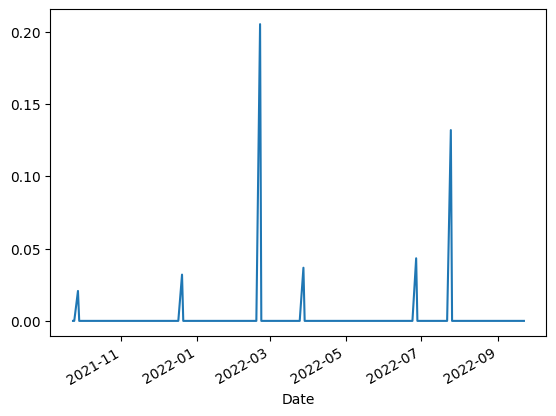

In [5]:
dados.Dividends.plot();

#### **5.1.2 - Quando WEG pagou os dividendos?**

In [6]:
dados[dados.Dividends != 0]

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2021-09-27 00:00:00-03:00,38.962067,39.455499,38.240897,38.772285,6418800,0.020705,0.0
2021-12-20 00:00:00-03:00,32.301941,32.577377,31.798560,32.301941,4157000,0.032000,0.0
2022-02-21 00:00:00-03:00,28.509123,28.585632,28.078761,28.231779,4769200,0.205203,0.0
2022-03-28 00:00:00-03:00,31.595247,32.495231,31.355889,32.169704,8764800,0.036764,0.0
2022-06-27 00:00:00-03:00,25.557370,25.605321,24.818939,24.866890,6158200,0.043294,0.0
2022-07-25 00:00:00-03:00,24.984879,25.813853,24.965600,25.524675,10255700,0.131948,0.0


In [7]:
dados[dados.Dividends != 0].shape

(6, 7)

In [8]:
type(dados[dados.Dividends != 0])

pandas.core.frame.DataFrame

#### **5.1.3. Inspeção visual dos dias onde houve pagamento de dividendos**

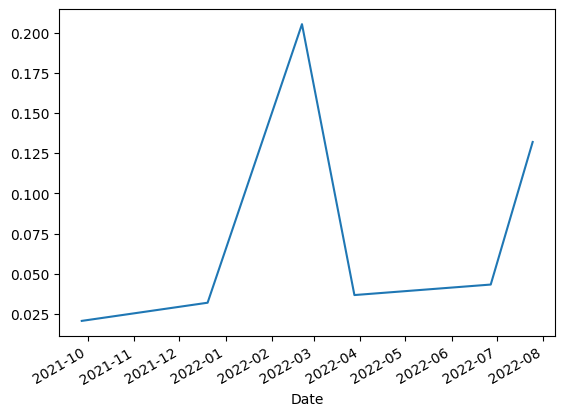

In [9]:
dados[dados.Dividends != 0].Dividends.plot();

#### **5.1.4. Últimos 5 pagamentos de Dividendos**

In [10]:
dados[dados.Dividends != 0].tail(5)

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2021-12-20 00:00:00-03:00,32.301941,32.577377,31.798560,32.301941,4157000,0.032000,0.0
2022-02-21 00:00:00-03:00,28.509123,28.585632,28.078761,28.231779,4769200,0.205203,0.0
2022-03-28 00:00:00-03:00,31.595247,32.495231,31.355889,32.169704,8764800,0.036764,0.0
2022-06-27 00:00:00-03:00,25.557370,25.605321,24.818939,24.866890,6158200,0.043294,0.0
2022-07-25 00:00:00-03:00,24.984879,25.813853,24.965600,25.524675,10255700,0.131948,0.0


#### **5.1.5. Suavizar o gráfico dos valores pagos de dividendos**

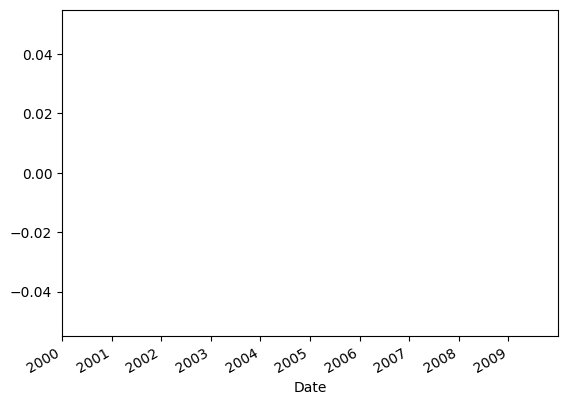

In [11]:
dados[dados.Dividends != 0].Dividends.rolling(10).mean().plot();

#### **5.1.6. Quantos dividendos a Weg pagou por mês e ano?**

A biblioteca Pandas tem alguns atributos para recuperar elementos específicos da data

In [12]:
dados.index.month

Index([ 9,  9,  9,  9,  9,  9, 10, 10, 10, 10,
       ...
        9,  9,  9,  9,  9,  9,  9,  9,  9,  9],
      dtype='int32', name='Date', length=250)

In [13]:
dados.index.year

Index([2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021,
       ...
       2022, 2022, 2022, 2022, 2022, 2022, 2022, 2022, 2022, 2022],
      dtype='int32', name='Date', length=250)

In [14]:
dados['month'] = dados.index.month
dados['year'] = dados.index.year

In [15]:
dados.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,month,year
Date,,,,,,,,,
2021-09-23 00:00:00-03:00,38.695961,39.246052,38.610602,39.046879,7578700,0.000000,0.0,9,2021
2021-09-24 00:00:00-03:00,38.676996,39.502133,38.041549,39.208118,6960700,0.000000,0.0,9,2021
2021-09-27 00:00:00-03:00,38.962067,39.455499,38.240897,38.772285,6418800,0.020705,0.0,9,2021
2021-09-28 00:00:00-03:00,38.535059,39.265717,38.259876,38.591991,7499700,0.000000,0.0,9,2021
2021-09-29 00:00:00-03:00,38.905127,38.905127,37.491256,37.832863,7602400,0.000000,0.0,9,2021


In [16]:
dados['year_month'] = dados['year'].astype(str) + "-" + dados['month'].astype(str)

In [17]:
dados.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,month,year,year_month
Date,,,,,,,,,,
2021-09-23 00:00:00-03:00,38.695961,39.246052,38.610602,39.046879,7578700,0.000000,0.0,9,2021,2021-9
2021-09-24 00:00:00-03:00,38.676996,39.502133,38.041549,39.208118,6960700,0.000000,0.0,9,2021,2021-9
2021-09-27 00:00:00-03:00,38.962067,39.455499,38.240897,38.772285,6418800,0.020705,0.0,9,2021,2021-9
2021-09-28 00:00:00-03:00,38.535059,39.265717,38.259876,38.591991,7499700,0.000000,0.0,9,2021,2021-9
2021-09-29 00:00:00-03:00,38.905127,38.905127,37.491256,37.832863,7602400,0.000000,0.0,9,2021,2021-9


Qual a soma de dividendos a WEG pagou por ano?

In [18]:
dados.groupby(["year_month"])["Dividends"].sum()

year_month
2021-10    0.000000
2021-11    0.000000
2021-12    0.032000
2021-9     0.020705
2022-1     0.000000
2022-2     0.205203
2022-3     0.036764
2022-4     0.000000
2022-5     0.000000
2022-6     0.043294
2022-7     0.131948
2022-8     0.000000
2022-9     0.000000
Name: Dividends, dtype: float64

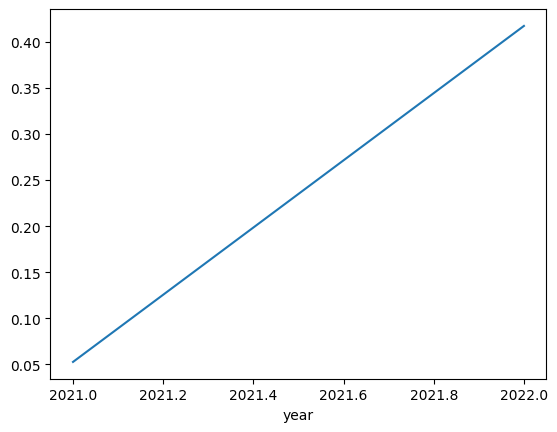

In [19]:
dados.groupby(["year"])["Dividends"].sum().plot();

Quantas vezes a WEG pagou dividendos por ano?

In [20]:
dividendos_naonulos = dados[dados.Dividends != 0]

In [21]:
dividendos_naonulos

,Open,High,Low,Close,Volume,Dividends,Stock Splits,month,year,year_month
Date,,,,,,,,,,
2021-09-27 00:00:00-03:00,38.962067,39.455499,38.240897,38.772285,6418800,0.020705,0.0,9,2021,2021-9
2021-12-20 00:00:00-03:00,32.301941,32.577377,31.798560,32.301941,4157000,0.032000,0.0,12,2021,2021-12
2022-02-21 00:00:00-03:00,28.509123,28.585632,28.078761,28.231779,4769200,0.205203,0.0,2,2022,2022-2
2022-03-28 00:00:00-03:00,31.595247,32.495231,31.355889,32.169704,8764800,0.036764,0.0,3,2022,2022-3
2022-06-27 00:00:00-03:00,25.557370,25.605321,24.818939,24.866890,6158200,0.043294,0.0,6,2022,2022-6
2022-07-25 00:00:00-03:00,24.984879,25.813853,24.965600,25.524675,10255700,0.131948,0.0,7,2022,2022-7


In [22]:
dividendos_naonulos.year.value_counts()

year
2022    4
2021    2
Name: count, dtype: int64

Gráfico dos valores de dividendos pagos por mês

In [23]:
df = dados[dados.Dividends != 0].Dividends

In [24]:
df

Date
2021-09-27 00:00:00-03:00    0.020705
2021-12-20 00:00:00-03:00    0.032000
2022-02-21 00:00:00-03:00    0.205203
2022-03-28 00:00:00-03:00    0.036764
2022-06-27 00:00:00-03:00    0.043294
2022-07-25 00:00:00-03:00    0.131948
Name: Dividends, dtype: float64

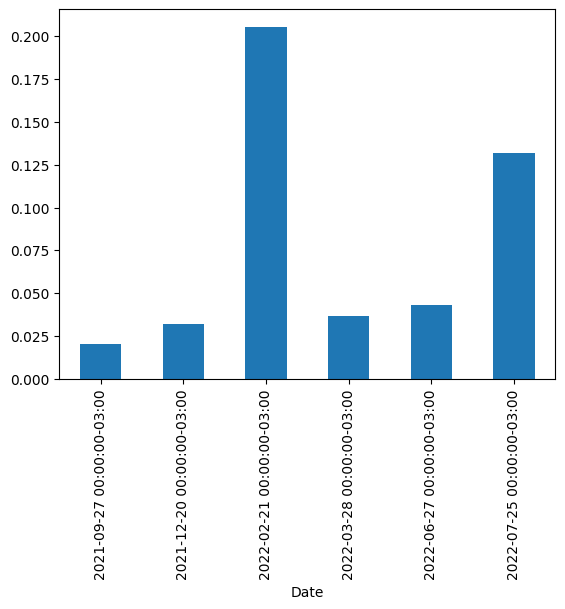

In [25]:
df.plot.bar();

In [26]:
df.index[1]

Timestamp('2021-12-20 00:00:00-0300', tz='America/Sao_Paulo')

In [27]:
label = df.index[1]

In [28]:
label.month_name()

'December'

In [29]:
df.index.month_name()

Index(['September', 'December', 'February', 'March', 'June', 'July'], dtype='object', name='Date')

In [30]:
label.month_name()[:3]

'Dec'

In [31]:
def formata_grafico(label):
  meses = label.month_name()[:3]
  return meses

In [32]:
formata_grafico(df.index[1])

'Dec'

In [33]:
list(map(formata_grafico, df.index))

['Sep', 'Dec', 'Feb', 'Mar', 'Jun', 'Jul']

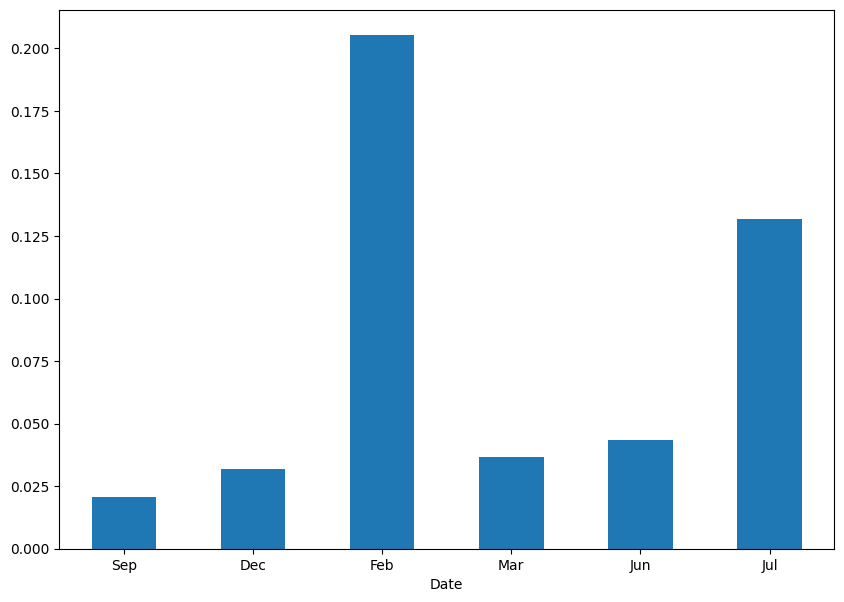

In [34]:
ax = df.plot(kind = 'bar', figsize = (10,7), rot = 0);
ax.set_xticklabels(map(formata_grafico, df.index));

In [35]:
sum(dados[dados.Dividends != 0].Dividends)

0.46991400000000005

In [36]:
soma_dividendos = sum(dados[dados.Dividends != 0].Dividends)

In [37]:
soma_dividendos

0.46991400000000005

### **5.2. Dividend Yield**

O Dividend Yield (DY) pode ser entendido como o

retorno em dividendos que uma empresa paga aos seus acionistas.

>
>Cálculo

Pode ser calculado dividindo a soma dos dividendos pagos por

ação pelo preço do papel na data de referência.
>
>

Portanto, o DY muda conforme a cotação das ações também muda.

#### **5.2.1. Cálculo do Dividend Yield estático**

In [38]:
dados.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,month,year,year_month
Date,,,,,,,,,,
2021-09-23 00:00:00-03:00,38.695961,39.246052,38.610602,39.046879,7578700,0.000000,0.0,9,2021,2021-9
2021-09-24 00:00:00-03:00,38.676996,39.502133,38.041549,39.208118,6960700,0.000000,0.0,9,2021,2021-9
2021-09-27 00:00:00-03:00,38.962067,39.455499,38.240897,38.772285,6418800,0.020705,0.0,9,2021,2021-9
2021-09-28 00:00:00-03:00,38.535059,39.265717,38.259876,38.591991,7499700,0.000000,0.0,9,2021,2021-9
2021-09-29 00:00:00-03:00,38.905127,38.905127,37.491256,37.832863,7602400,0.000000,0.0,9,2021,2021-9


In [39]:
preco_final = yf.download('WEGE3.SA', start = '2022-09-01', auto_adjust=False, multi_level_index=False)['Adj Close'].iloc[-1]

[*********************100%***********************]  1 of 1 completed


In [40]:
preco_final

52.45000076293945

In [41]:
DY = soma_dividendos/preco_final

In [42]:
round(DY*100, 2)

0.9

#### **5.2.2. Cálculo do Dividend Yield Dinâmico**

Aprendemos a obter os dados dos dividendos para uma ação, depois somar esses dividendos ao longo de um período de um ano, e por fim, dividir a soma desses dividendos pelo preço atual da ação.

Agora vamos dar um passo adiante!

Vamos utilizar esse conhecimento obtido para fazer o cálculo do Dividend Yield ao longo de uma janela maior de tempo.

Ou seja, vamos calcular a soma dos dividendos pagos ao longo de janelas de 365 dias e depois dividir o resultado pelas cotações.

Vamos juntos?

Vamos começar obtendo os dados de WEGE3 desde o seu IPO

In [43]:
dados_weg = papel.history(start = '2001-01-01', end = '2022-09-23')

In [44]:
dados_weg.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2001-01-01 00:00:00-02:00,0.12392,0.12392,0.12392,0.12392,0,0.0,0.0
2001-01-02 00:00:00-02:00,0.12392,0.12392,0.12392,0.12392,0,0.0,0.0
2001-01-03 00:00:00-02:00,0.12392,0.12392,0.12392,0.12392,0,0.0,0.0
2001-01-04 00:00:00-02:00,0.12392,0.12392,0.12392,0.12392,0,0.0,0.0
2001-01-05 00:00:00-02:00,0.12392,0.12392,0.12392,0.12392,0,0.0,0.0


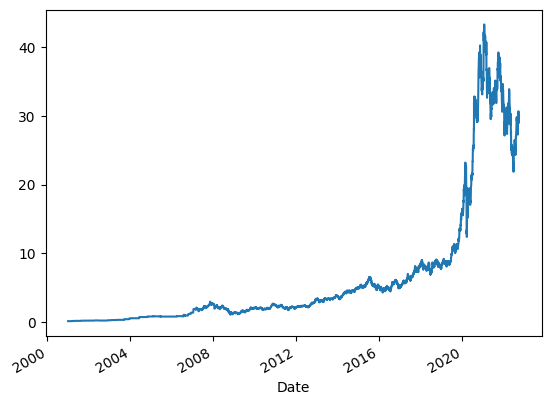

In [45]:
dados_weg['Close'].plot();

Agora, vamos criar uma coluna nova que vai conter o resultado da soma dos dividendos pagos por Weg em janelas de 365 dias.

In [46]:
dados_weg['soma_dividendos'] = dados_weg.Dividends.rolling('365D').sum()

In [47]:
dados_weg.tail()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,soma_dividendos
Date,,,,,,,,
2022-09-16 00:00:00-03:00,28.724896,29.534591,28.435720,29.380363,12522000,0.0,0.0,0.469914
2022-09-19 00:00:00-03:00,29.341807,29.862324,28.975515,29.496035,5470400,0.0,0.0,0.469914
2022-09-20 00:00:00-03:00,29.563509,30.305730,29.544230,30.006912,7372000,0.0,0.0,0.469914
2022-09-21 00:00:00-03:00,29.881603,30.421399,29.563508,30.055109,6342700,0.0,0.0,0.469914
2022-09-22 00:00:00-03:00,30.218981,30.257537,28.994798,29.891247,8889000,0.0,0.0,0.469914


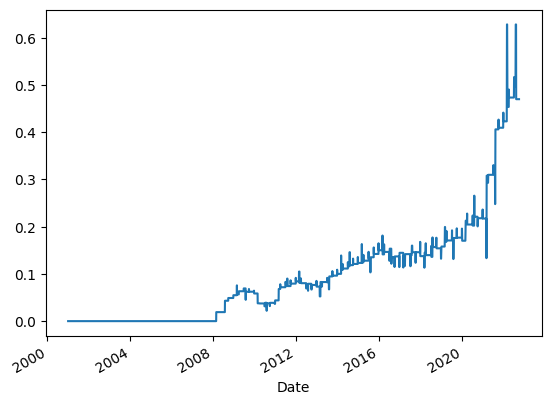

In [48]:
dados_weg['soma_dividendos'].plot();

Vamos criar um novo dataframe removendo os NaNs gerados no cálculo anterior

In [50]:
dados_weg_final = dados_weg.dropna()

Por fim, vamos criar uma nova coluna que vai pegar o resultado da coluna anterior de soma dos dividendos e dividir pelo preço do papel

In [51]:
dados_weg_final['dividend_yeld'] = dados_weg_final['soma_dividendos']/dados_weg_final['Close']

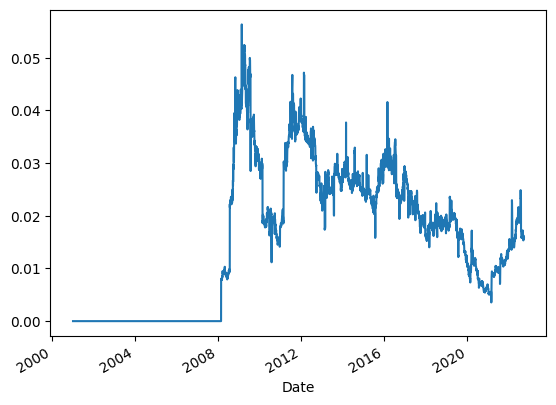

In [52]:
dados_weg_final['dividend_yeld'].plot();

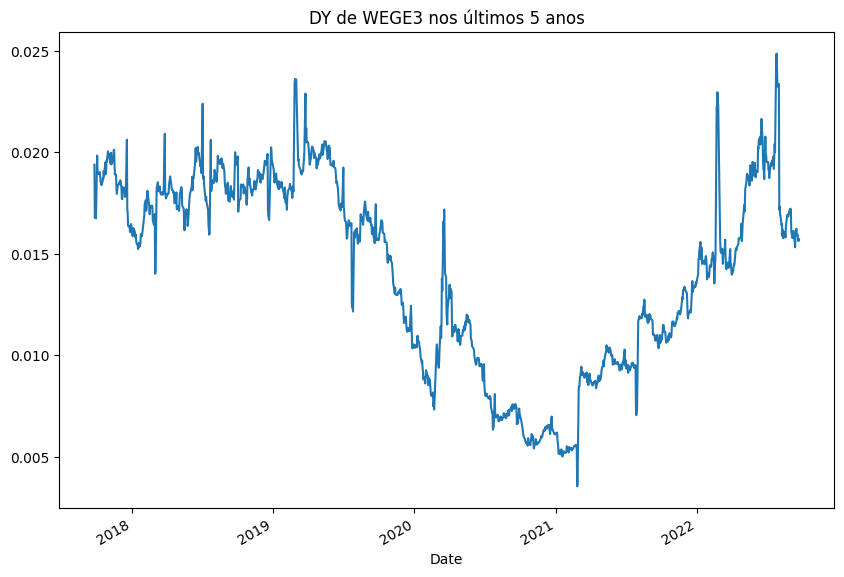

In [53]:
dados_weg_final.dividend_yeld[dados_weg_final.index > '2017-09-23'].plot(figsize = (10,7), title = 'DY de WEGE3 nos últimos 5 anos');

### **5.3. Estudo de caso: encontrando as maiores pagadoras de dividendos**

Vamos usar uma outra biblioteca para expandir o nosso conhecimento

#### **5.3.1. Acessando os eventos de pagamentos de dividendos dos ativos listados no IBOV**

Lista atual (24/09/2022) do IBOV (91 ativos)<p>
https://www.b3.com.br/pt_br/market-data-e-indices/indices/indices-amplos/indice-ibovespa-ibovespa-composicao-da-carteira.htm)

In [58]:
tickers_IBOV = ['ABEV3', 'ALPA4', 'AMER3', 'ASAI3', 'AZUL4', 'B3SA3', 'BBAS3', 'BBDC3', 'BBDC4', 'BBSE3', 'BEEF3',
                'BPAC11', 'BPAN4', 'BRAP4', 'BRFS3', 'BRKM5', 'BRML3', 'CASH3', 'CCRO3', 'CIEL3', 'CMIG4', 'CMIN3',
                'COGN3', 'CPFE3', 'CPLE6', 'CRFB3', 'CSAN3', 'CSNA3', 'CVCB3', 'CYRE3', 'DXCO3', 'ECOR3', 'EGIE3',
                'ELET3', 'ELET6', 'EMBR3', 'ENBR3', 'ENEV3', 'ENGI11', 'EQTL3', 'EZTC3', 'FLRY3', 'GGBR4', 'GOAU4',
                'GOLL4', 'HAPV3', 'HYPE3', 'IGTI11', 'IRBR3', 'ITSA4', 'ITUB4', 'JBSS3', 'JHSF3', 'KLBN11',
                'LREN3', 'LWSA3', 'MGLU3', 'MRFG3', 'MRVE3', 'MULT3', 'NTCO3', 'PCAR3', 'PETR3', 'PETR4', 'PETZ3',
                'POSI3', 'PRIO3', 'QUAL3', 'RADL3', 'RAIL3', 'RDOR3', 'RENT3', 'RRRP3', 'SANB11', 'SBSP3', 'SLCE3',
                'SOMA3', 'SULA11', 'SUZB3', 'TAEE11', 'TIMS3', 'TOTS3', 'UGPA3', 'USIM5', 'VALE3', 'VBBR3', 'VIIA3',
                'VIVT3', 'WEGE3', 'YDUQ3']

In [60]:
# List comprehension (adicionar '.SA' usando um loop em todos os tickers da lista para extrair do YF)

tickers_IBOV_yf = [x + '.SA' for x in tickers_IBOV]

Download dos dividendos na série histórica de 10 anos (2012 a 2022) utilizando a integração entre VectorBT e YF

In [95]:
# O warning no output pode indicar apenas que alguns tickers não apresentam a cobertura de todo o período acessado

# Código antigo:
# div_dez_mais = vbt.YFData.download(tickers_IBOV_yf, start = '2012-01-01', end = '2022-09-20').get('Dividends')


# Código atualizado: Faremos um tratamento de erros caso não seja possível baixar os dividendos de algum ticker
# Inicializar lista de tickers válidos
valid_tickers = []

# Verificar cada ticker individualmente
for ticker in tickers_IBOV_yf:
    try:
        data = vbt.YFData.download(ticker, start='2012-01-01', end='2022-09-20')
        if not data.get('Close').empty:  # Verifica se há dados de fechamento
            valid_tickers.append(ticker)
    except Exception as e:
        print(f"Erro ao baixar dados para {ticker}: {e}")

# Fazer download dos dividendos apenas para os tickers válidos
print(f"Tickers válidos: {valid_tickers}")
div_dez_mais = vbt.YFData.download(valid_tickers, start='2012-01-01', end='2022-09-20').get('Dividends')


$BBDC4.SA: possibly delisted; no price data found  (1d 2012-01-01 00:00:00-03:00 -> 2022-09-20 00:00:00-03:00)
$BRML3.SA: possibly delisted; no timezone found
$CIEL3.SA: possibly delisted; no timezone found
$ENBR3.SA: possibly delisted; no timezone found
$RRRP3.SA: possibly delisted; no timezone found
$SOMA3.SA: possibly delisted; no timezone found
$SULA11.SA: possibly delisted; no timezone found
$VIIA3.SA: possibly delisted; no timezone found


Tickers válidos: ['ABEV3.SA', 'ALPA4.SA', 'AMER3.SA', 'ASAI3.SA', 'AZUL4.SA', 'B3SA3.SA', 'BBAS3.SA', 'BBDC3.SA', 'BBSE3.SA', 'BEEF3.SA', 'BPAC11.SA', 'BPAN4.SA', 'BRAP4.SA', 'BRFS3.SA', 'BRKM5.SA', 'CASH3.SA', 'CCRO3.SA', 'CMIG4.SA', 'CMIN3.SA', 'COGN3.SA', 'CPFE3.SA', 'CPLE6.SA', 'CRFB3.SA', 'CSAN3.SA', 'CSNA3.SA', 'CVCB3.SA', 'CYRE3.SA', 'DXCO3.SA', 'ECOR3.SA', 'EGIE3.SA', 'ELET3.SA', 'ELET6.SA', 'EMBR3.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQTL3.SA', 'EZTC3.SA', 'FLRY3.SA', 'GGBR4.SA', 'GOAU4.SA', 'GOLL4.SA', 'HAPV3.SA', 'HYPE3.SA', 'IGTI11.SA', 'IRBR3.SA', 'ITSA4.SA', 'ITUB4.SA', 'JBSS3.SA', 'JHSF3.SA', 'KLBN11.SA', 'LREN3.SA', 'LWSA3.SA', 'MGLU3.SA', 'MRFG3.SA', 'MRVE3.SA', 'MULT3.SA', 'NTCO3.SA', 'PCAR3.SA', 'PETR3.SA', 'PETR4.SA', 'PETZ3.SA', 'POSI3.SA', 'PRIO3.SA', 'QUAL3.SA', 'RADL3.SA', 'RAIL3.SA', 'RDOR3.SA', 'RENT3.SA', 'SANB11.SA', 'SBSP3.SA', 'SLCE3.SA', 'SUZB3.SA', 'TAEE11.SA', 'TIMS3.SA', 'TOTS3.SA', 'UGPA3.SA', 'USIM5.SA', 'VALE3.SA', 'VBBR3.SA', 'VIVT3.SA', 'WEGE3.SA', 'YDU

d:\current_projects\material_PMF_2.0\.venv\Lib\site-packages\vectorbt\data\base.py:527: UserWarning:

Symbols have mismatching index. Setting missing data points to NaN.



In [96]:
div_dez_mais_12M = div_dez_mais.rolling('365D').sum()

In [97]:
div_dez_mais_12M.tail()

symbol,ABEV3.SA,ALPA4.SA,AMER3.SA,ASAI3.SA,AZUL4.SA,B3SA3.SA,BBAS3.SA,BBDC3.SA,BBSE3.SA,BEEF3.SA,...,TAEE11.SA,TIMS3.SA,TOTS3.SA,UGPA3.SA,USIM5.SA,VALE3.SA,VBBR3.SA,VIVT3.SA,WEGE3.SA,YDUQ3.SA
Date,,,,,,,,,,,,,,,,,,,,,
2022-09-13 03:00:00+00:00,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.525736,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.582261,3.757189,0.469914,0.126471
2022-09-14 03:00:00+00:00,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.433366,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.248589,3.757189,0.469914,0.126471
2022-09-15 03:00:00+00:00,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.433366,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.248589,3.757189,0.469914,0.126471
2022-09-16 03:00:00+00:00,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.433366,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.248589,3.757189,0.469914,0.126471
2022-09-19 03:00:00+00:00,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.433366,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.248589,3.757189,0.469914,0.126471


In [98]:
close_todo_IBOV = yf.download(valid_tickers, start = '2012-01-01', end = '2022-09-20', multi_level_index=False)['Close']

[*********************100%***********************]  82 of 82 completed


In [103]:
close_todo_IBOV.tail()

Ticker,ABEV3.SA,ALPA4.SA,AMER3.SA,ASAI3.SA,AZUL4.SA,B3SA3.SA,BBAS3.SA,BBDC3.SA,BBSE3.SA,BEEF3.SA,...,TAEE11.SA,TIMS3.SA,TOTS3.SA,UGPA3.SA,USIM5.SA,VALE3.SA,VBBR3.SA,VIVT3.SA,WEGE3.SA,YDUQ3.SA
Date,,,,,,,,,,,,,,,,,,,,,
2022-09-13,13.338837,21.889999,1706.0,17.747780,16.969999,11.807716,17.293964,13.200345,23.728386,13.287451,...,34.241844,10.392004,28.312763,12.748689,7.551378,58.552834,15.905554,36.315426,29.505678,11.518536
2022-09-14,13.159160,22.170000,1674.0,17.972683,16.870001,11.716041,17.311163,13.126090,23.519289,12.966817,...,34.183586,10.511356,28.726582,12.758246,7.311652,57.480438,15.828595,36.280350,29.515318,11.208012
2022-09-15,13.090712,22.129999,1612.0,17.884678,17.100000,11.514359,17.134871,13.068337,23.694929,13.070551,...,33.983883,10.511356,28.187660,12.289966,7.173348,58.638638,15.418128,36.201412,28.927326,11.072157
2022-09-16,13.065043,21.049999,1651.0,17.503319,16.799999,11.349343,16.941378,12.936335,24.648415,13.372324,...,33.825771,10.383481,28.572603,12.175284,7.053485,58.552834,15.264202,35.631386,29.380367,10.460810
2022-09-19,13.236164,21.459999,1742.0,17.728222,17.750000,12.119411,17.276766,13.249846,24.932787,13.504350,...,34.067093,10.409055,28.543732,12.433317,7.422295,60.448830,15.768734,35.947105,29.496038,11.935804


In [100]:
type(div_dez_mais_12M.index)

pandas.core.indexes.datetimes.DatetimeIndex

In [101]:
type(close_todo_IBOV.index)

pandas.core.indexes.datetimes.DatetimeIndex

In [ ]:
# Código antigo
# div_dez_mais_12M.index = pd.to_datetime(div_dez_mais_12M.index, utc = True)
# close_todo_IBOV.index = pd.to_datetime(close_todo_IBOV.index, utc = True)

div_dez_mais_12M.index = pd.to_datetime(div_dez_mais_12M.index).tz_localize(None).date
close_todo_IBOV.index = pd.to_datetime(close_todo_IBOV.index).tz_localize(None)

In [115]:
div_dez_mais_12M.tail()

symbol,ABEV3.SA,ALPA4.SA,AMER3.SA,ASAI3.SA,AZUL4.SA,B3SA3.SA,BBAS3.SA,BBDC3.SA,BBSE3.SA,BEEF3.SA,...,TAEE11.SA,TIMS3.SA,TOTS3.SA,UGPA3.SA,USIM5.SA,VALE3.SA,VBBR3.SA,VIVT3.SA,WEGE3.SA,YDUQ3.SA
2022-09-13,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.525736,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.582261,3.757189,0.469914,0.126471
2022-09-14,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.433366,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.248589,3.757189,0.469914,0.126471
2022-09-15,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.433366,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.248589,3.757189,0.469914,0.126471
2022-09-16,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.433366,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.248589,3.757189,0.469914,0.126471
2022-09-19,0.6036,0.43474,62.09631,0.172071,0.0,0.706089,1.433366,0.588579,1.966093,0.910393,...,4.885399,0.480376,0.23,0.58287,0.822081,15.488552,0.248589,3.757189,0.469914,0.126471


In [116]:
close_todo_IBOV.tail()

Ticker,ABEV3.SA,ALPA4.SA,AMER3.SA,ASAI3.SA,AZUL4.SA,B3SA3.SA,BBAS3.SA,BBDC3.SA,BBSE3.SA,BEEF3.SA,...,TAEE11.SA,TIMS3.SA,TOTS3.SA,UGPA3.SA,USIM5.SA,VALE3.SA,VBBR3.SA,VIVT3.SA,WEGE3.SA,YDUQ3.SA
Date,,,,,,,,,,,,,,,,,,,,,
2022-09-13,13.338837,21.889999,1706.0,17.747780,16.969999,11.807716,17.293964,13.200345,23.728386,13.287451,...,34.241844,10.392004,28.312763,12.748689,7.551378,58.552834,15.905554,36.315426,29.505678,11.518536
2022-09-14,13.159160,22.170000,1674.0,17.972683,16.870001,11.716041,17.311163,13.126090,23.519289,12.966817,...,34.183586,10.511356,28.726582,12.758246,7.311652,57.480438,15.828595,36.280350,29.515318,11.208012
2022-09-15,13.090712,22.129999,1612.0,17.884678,17.100000,11.514359,17.134871,13.068337,23.694929,13.070551,...,33.983883,10.511356,28.187660,12.289966,7.173348,58.638638,15.418128,36.201412,28.927326,11.072157
2022-09-16,13.065043,21.049999,1651.0,17.503319,16.799999,11.349343,16.941378,12.936335,24.648415,13.372324,...,33.825771,10.383481,28.572603,12.175284,7.053485,58.552834,15.264202,35.631386,29.380367,10.460810
2022-09-19,13.236164,21.459999,1742.0,17.728222,17.750000,12.119411,17.276766,13.249846,24.932787,13.504350,...,34.067093,10.409055,28.543732,12.433317,7.422295,60.448830,15.768734,35.947105,29.496038,11.935804


#### **5.3.2. Cálculo do Dividend Yield em janelas de 365 dias**

In [117]:
DY_12M = (div_dez_mais_12M/close_todo_IBOV)*100

In [118]:
DY_12M.tail()

symbol,ABEV3.SA,ALPA4.SA,AMER3.SA,ASAI3.SA,AZUL4.SA,B3SA3.SA,BBAS3.SA,BBDC3.SA,BBSE3.SA,BEEF3.SA,...,TAEE11.SA,TIMS3.SA,TOTS3.SA,UGPA3.SA,USIM5.SA,VALE3.SA,VBBR3.SA,VIVT3.SA,WEGE3.SA,YDUQ3.SA
2022-09-13,4.525132,1.986021,3.639877,0.969535,0.0,5.979895,8.822361,4.458815,8.285827,6.851525,...,14.267336,4.622554,0.812354,4.572000,10.886503,26.452267,3.660740,10.345986,1.592622,1.097978
2022-09-14,4.586919,1.960938,3.709457,0.957403,0.0,6.026686,8.280010,4.484039,8.359492,7.020944,...,14.291652,4.570067,0.800652,4.568575,11.243437,26.945779,1.570506,10.355989,1.592102,1.128398
2022-09-15,4.610903,1.964483,3.852128,0.962114,0.0,6.132248,8.365199,4.503855,8.297526,6.965223,...,14.375635,4.570067,0.815960,4.742650,11.460213,26.413560,1.612316,10.378570,1.624464,1.142244
2022-09-16,4.619962,2.065273,3.761133,0.983076,0.0,6.221408,8.460741,4.549813,7.976550,6.808039,...,14.442831,4.626348,0.804967,4.787321,11.654961,26.452267,1.628575,10.544605,1.599415,1.208998
2022-09-19,4.560234,2.025816,3.564656,0.970605,0.0,5.826100,8.296495,4.442157,7.885573,6.741480,...,14.340522,4.614982,0.805781,4.687969,11.075833,25.622584,1.576468,10.451993,1.593143,1.059593


In [120]:
DY_12M.index = pd.to_datetime(DY_12M.index)
DY_12M.vbt.plot(width=1000, height=500).show();

Média histórica do Dividend Yield

In [121]:
mediaDY = pd.DataFrame(DY_12M.mean().sort_values(ascending = False))

In [122]:
mediaDY.head(10)

,0
symbol,
BRAP4.SA,29.269440
CMIG4.SA,19.587281
TAEE11.SA,18.384162
PETR4.SA,11.744320
VIVT3.SA,11.412090
ELET6.SA,11.241537
CMIN3.SA,11.215498
CPLE6.SA,10.967435
BBSE3.SA,10.575817


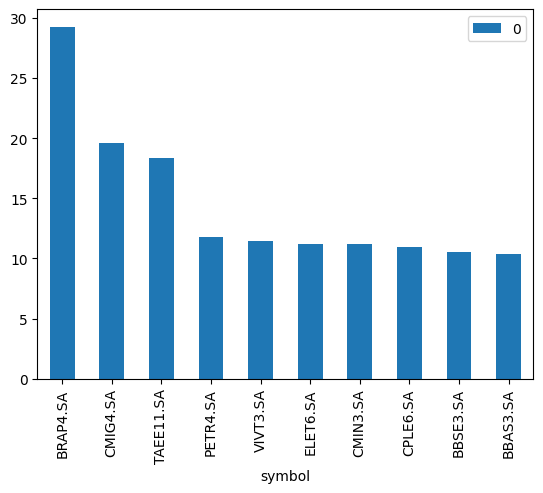

In [123]:
mediaDY.head(10).plot.bar();

### **5.4. Fundos Imobiliários**

#### **5.4.1. Usando Yahoo Finance**

In [136]:
dados1 = yf.download('HGLG11.SA', start = '2000-01-01', multi_level_index=False)

[*********************100%***********************]  1 of 1 completed


In [137]:
dados1.head()

,Close,High,Low,Open,Volume
Date,,,,,
2011-03-02,77.986397,77.986397,77.986397,77.986397,2342
2011-03-03,77.986397,77.986397,77.986397,77.986397,0
2011-03-04,77.986397,77.986397,77.986397,77.986397,0
2011-03-09,77.986397,77.986397,77.986397,77.986397,0
2011-03-10,77.986397,77.986397,77.986397,77.986397,0


In [126]:
papel = yf.Ticker('HGLG11.SA')

In [127]:
dados2 = papel.history(start = '2000-01-01')

In [128]:
dados2.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2011-03-02 00:00:00-03:00,77.986412,77.986412,77.986412,77.986412,2342,0.0,0.0
2011-03-03 00:00:00-03:00,77.986412,77.986412,77.986412,77.986412,0,0.0,0.0
2011-03-04 00:00:00-03:00,77.986412,77.986412,77.986412,77.986412,0,0.0,0.0
2011-03-09 00:00:00-03:00,77.986412,77.986412,77.986412,77.986412,0,0.0,0.0
2011-03-10 00:00:00-03:00,77.986412,77.986412,77.986412,77.986412,0,0.0,0.0


[*********************100%***********************]  1 of 1 completed


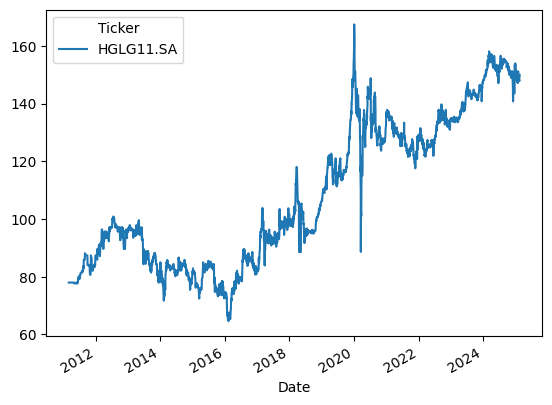

In [131]:
yf.download('HGLG11.SA', start = '2000-01-01').Close.plot();

[*********************100%***********************]  1 of 1 completed


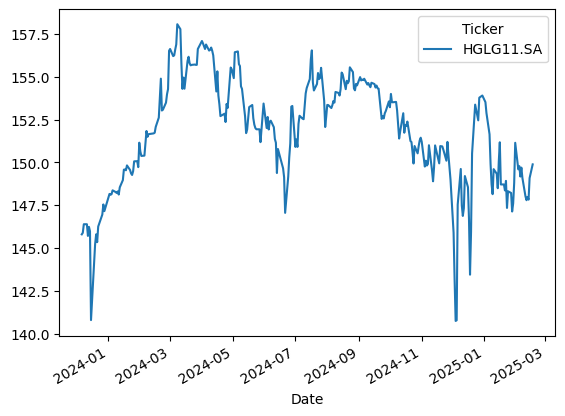

In [132]:
yf.download('HGLG11.SA', start = '2000-01-01').tail(300).Close.plot();

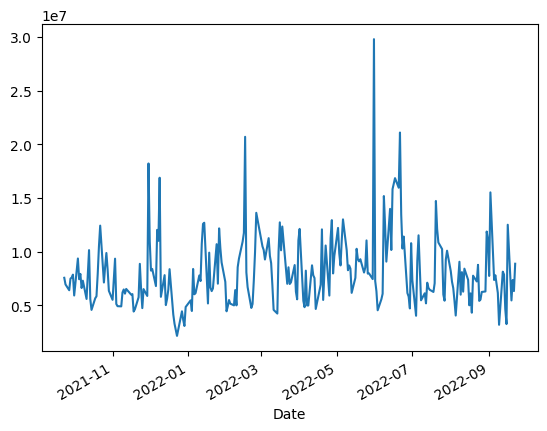

In [133]:
dados.tail(300).Volume.plot();

In [138]:
papel = yf.Ticker('HGLG11.SA')

In [139]:
dados = papel.history(start = '2000-01-01')

In [140]:
dados[dados.Dividends != 0]

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2017-11-01 00:00:00-02:00,97.773436,97.773436,94.507050,94.507050,6853,0.854361,0.0
2017-12-01 00:00:00-02:00,100.162704,100.162704,96.906493,97.285034,4460,0.854361,0.0
2022-04-01 00:00:00-03:00,124.926169,125.711249,124.255424,124.324020,30878,1.080226,0.0
2022-05-02 00:00:00-03:00,126.541203,126.541203,124.766545,125.298943,30704,1.086190,0.0
2022-06-01 00:00:00-03:00,127.172449,127.382170,125.991763,126.294701,44298,1.086190,0.0
2022-07-01 00:00:00-03:00,128.112543,129.103383,126.994863,127.454620,52589,3.258570,0.0
2022-08-01 00:00:00-03:00,133.677131,133.884587,132.456375,132.695740,36485,1.086190,0.0
2022-09-01 00:00:00-03:00,137.626621,138.108424,136.165157,136.510452,38288,1.086190,0.0
2022-10-03 00:00:00-03:00,137.391696,137.391696,135.088361,135.371231,63249,1.086190,0.0


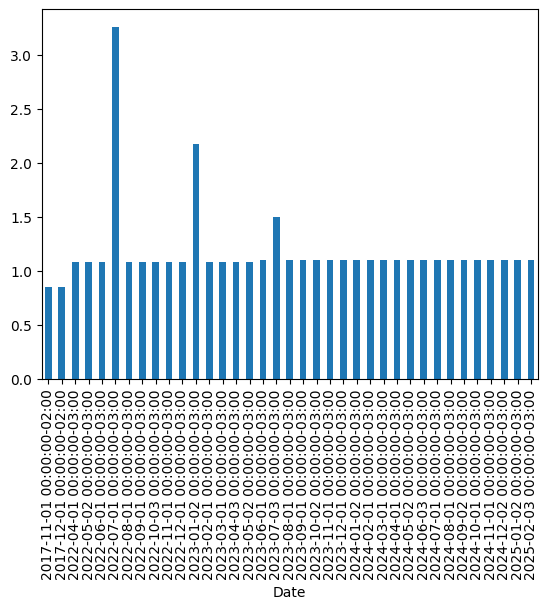

In [141]:
dados[dados.Dividends != 0].Dividends.plot.bar();

#### **5.4.2. Usando Investpy - Está descontinuada**

In [ ]:
!pip install investpy

In [ ]:
import investpy

In [ ]:
knri = investpy.stocks.get_stock_dividends('KNRI11', 'Brazil')

knri.index = knri.Date

knri.head()

In [ ]:
knri.Dividend.plot();

In [ ]:
knri.Dividend.plot.bar();

In [ ]:
kncr = investpy.stocks.get_stock_dividends('KNCR11', 'Brazil')

In [ ]:
kncr.head()

In [ ]:
kncr.Dividend.plot();

In [ ]:
kncr.head(12).Dividend.plot();

In [ ]:
kncr.head(12).Dividend.plot.bar();

In [ ]:
kncr.dtypes

In [ ]:
investpy.stocks.get_stock_dividends('PETR4', 'Brazil')

#### **5.4.3. Usando a Carteira Global - Está descontinuada**

In [143]:
import requests
import pandas as pd
from datetime import datetime, timedelta

In [144]:
nome_fii = 'HCTR11'
initial_date_yf = '2018-01-01'
acesso = {'x-api-key': 'jZscuLc4sN6dPO4FfOiSn7617Meab4B51GdL31ri'}

In [145]:
url = f'https://api.carteiraglobal.com/equity/{nome_fii}/report?init_date={initial_date_yf}'

In [ ]:
res = requests.get(url, headers = acesso)

query = res.json()

hctr = pd.DataFrame(query)

hctr

In [ ]:
hctr = hctr[[ 'date_report', 'open_quote_value', 'max_quote_value', 'min_quote_value', 'quote_value', 'volume' ]]

In [ ]:
hctr.columns = ['Date', 'Open', 'High', 'Low', 'Close', 'Volume']

hctr

In [ ]:
hctr = hctr.set_index('Date', drop = True)

hctr

In [ ]:
hctr.tail(300).Close.plot();

In [ ]:
def captura_ohlc_carteira_global(ativo):
  url = f'https://api.carteiraglobal.com/equity/{ativo}/report?init_date={initial_date_yf}'
  res = requests.get(url, headers = acesso)
  query = res.json()
  dados = pd.DataFrame(query)
  dados = dados[[ 'date_report', 'open_quote_value', 'max_quote_value', 'min_quote_value', 'quote_value', 'volume' ]]
  dados.columns = ['Date', 'Open', 'High', 'Low', 'Close', 'Volume']
  dados = dados.set_index('Date', drop = True)
  return dados

In [ ]:
vrta = captura_ohlc_carteira_global('VRTA11')

In [ ]:
vrta.tail(300).Close.plot();

E se quiséssemos os rendimentos?

In [ ]:
end_date = '2022-09-25'

In [ ]:
nome_fii = 'KNRI11'

In [ ]:
url = f'https://api.carteiraglobal.com/equity/{nome_fii}/event?end_date={end_date}'
res = requests.get(url, headers = acesso)
query = res.json()
dividendos = pd.DataFrame(query)

In [ ]:
dividendos

In [ ]:
dividendos = dividendos.loc[initial_date_yf:]

In [ ]:
dividendos.head()

In [ ]:
dividendos = dividendos[['date_com', 'date_pmt',  'quote_value']]
dividendos.columns = ['Data base', 'Data pgto', 'Dividendos']
dividendos = dividendos.set_index('Data base', drop = False)

In [ ]:
dividendos.head()

In [ ]:
def captura_dividendos_carteira_global(ativo):
  url = f'https://api.carteiraglobal.com/equity/{nome_fii}/event?end_date={end_date}'
  res = requests.get(url, headers = acesso)
  query = res.json()
  dividendos = pd.DataFrame(query)
  dividendos = dividendos.loc[initial_date_yf:]
  dividendos = dividendos[['date_com', 'date_pmt',  'quote_value']]
  dividendos.columns = ['Data base', 'Data pgto', 'Dividendos']
  dividendos = dividendos.set_index('Data base', drop = False)
  return dividendos

In [ ]:
captura_dividendos_carteira_global('TGAR11')

In [ ]:
captura_dividendos_carteira_global('TGAR11').Dividendos.plot();

Juntando tudo num dataframe final

In [ ]:
fii_tgar = captura_ohlc_carteira_global('TGAR11')

In [ ]:
fii_tgar.head()

In [ ]:
div_tgar =  captura_dividendos_carteira_global('TGAR11')

In [ ]:
tabela_dividendos = div_tgar.join(fii_tgar.Close)

In [ ]:
tabela_dividendos

In [ ]:
tabela_dividendos = tabela_dividendos.reset_index(drop = True)

In [ ]:
tabela_dividendos.head()

In [ ]:
tabela_dividendos = tabela_dividendos.dropna()

In [ ]:
tabela_dividendos.head()

In [ ]:
tabela_dividendos['DY'] = (tabela_dividendos.Dividendos/tabela_dividendos.Close)*100

In [ ]:
tabela_dividendos

In [ ]:
tabela_dividendos.DY.plot();